<div style="position: relative;">
    <div style="position: absolute; left: 770px; top: 230px; z-index: 1;">
        <img src="https://raw.githack.com/jcarreon14/datascience/main/3336_original.jpg" width="120">
    </div>
</div>

---
### **PROYECTO FINAL**
### **ENTRENAMIENTO Y OPTIMIZACION DE MODELOS DE MACHINE LEARNING**
#### **CURSO DATA SCIENCE - COMISION 46275 - ALUMNO JUAN JOSE CARREON**
#### **PROFESOR DANIEL GALEANO - TUTOR LUCIANO LISACHI**
---

#### **INDICE GENERAL DE CONTENIDO** <a id='seccion-1'></a>

1. [**Abstract**](#seccion-2)

2. [**Contexto empresarial**](#seccion-3)

3. [**Objetivo**](#seccion-4)

4. [**Problema Comercial**](#seccion-5)

5. [**Contexto Analítico**](#seccion-6)

6. [**Data Acquisition**](#seccion-7)

7. [**Data Wrangling**](#seccion-8)

8. [**Exploratory Data Analysis (EDA)**](#seccion-9)

9. [**Insights**](#seccion-10)

10. [**Feature Selection**](#seccion-11)

11. [**Entrenamiento y validación de modelos con algoritmos ML de clasificación**](#seccion-12)

12. [**Conclusión**](#seccion-13)

#### **1. Abstract** <a id='seccion-2'></a>

Las transacciones entre los diferentes participantes de la industria de la electricidad en Argentina se llevan a cabo a través del Mercado Eléctrico Mayorista (MEM), organizado conjuntamente con el proceso de privatización como un mercado competitivo en el que los generadores, distribuidores y determinados grandes usuarios de electricidad pueden comprar y vender electricidad a precios determinados por la oferta y la demanda, y se les permite entrar en los contratos de suministro de electricidad a largo plazo. El MEM consiste en:

+ Un mercado a término en donde las cantidades, los precios y las condiciones contractuales son acordadas directamente entre vendedores y compradores.
+ Un mercado spot, donde los precios son establecidos por hora en función del costo económico de producción.
+ Un sistema estabilizado de precios al contado a través de precios estacionales, establecidos semestralmente y diseñado para mitigar la volatilidad de los precios al contado para la compra de energía eléctrica por los distribuidores.

La implementación del MEM hizo necesaria la creación de una entidad encargada de su gestión y del envío de la electricidad al Sistema Argentino de Interconexión (SADI). Estas funciones fueron confiadas a la Compañía Administradora del Mercado Eléctrico Mayorista SA (CAMMESA), una empresa de administración privada con participación estatal. Esta empresa a su vez tiene a cargo las siguientes tareas:

+ Planificar necesidades de capacidad de energía y optimizar el uso de energía de acuerdo a las reglas establecidas por las autoridades pertinentes.
+ Controlar la operación del mercado a término y administrar el despacho técnico de energía eléctrica en los acuerdos celebrados en ese mercado.
+ Actuar como intermediario de los distintos agentes del MEM y desempeñar las funciones que tiene asignadas en el sector eléctrico, incluyendo la facturación y cobro de los pagos para las transacciones entre agentes del MEM.
+ Comprar y/o vender energía eléctrica en el extranjero mediante la realización de las operaciones de importación/exportación.
+ Comprar y administrar combustibles para los generadores del MEM.

Dentro del mercado, como se dijo inicialmente, se encuentran las generadoras, que son empresas que explotan plantas de generación de electricidad y que venden su producción parcial o totalmente a través del SADI. Al 31 de diciembre de 2021, la capacidad instalada de Argentina reportada por CAMMESA indicaba la siguiente participación segun fuente de generación: 59,1% térmica, 25,2% hidroeléctrica, 11,6% renovable y 4,1% nuclear.

Poniendo foco en el pilar de generación del mercado eléctrico mayorista, en este proyecto se buscar predecir en forma automática en que provincia del país se deben enfocar acciones de mejora en términos de eficiencia energética/medioambiental. Para esto se utilizaran datos históricos sobre máquinas de agentes que realizan emisiones como generadores. Para cumplir con este objetivo se realizará inicialmente un análisis de los datos disponibles, se buscará enriquecerlos con datos del segmento de la demanda y luego se avanzará con un análisis exploratorio de los mismos para dar respuesta a ciertos interrogantes del negocio identificando insights y proponiendo recomendaciones. Una vez hecho esto, se buscará modelizar, mediante entrenamiento y validación de algoritmos de machine learning de clasificación, una herramienta que permita identificar cual provincia corresponde a un nivel de generación y emisión dado que se tiene como parámetro de entrada entre otras variables disponibles.

##### [Volver al índice](#seccion-1)

#### **2. Contexto empresarial** <a id='seccion-3'></a>

Se desea entender como se comporta el segmento de Generación del mercado mayorista, y para ello CAMMESA suministra mensualmente datos de generación de energía en megavatioshora (MWh) y emisiones de gases de efecto invernadero en toneladas de CO2. En este caso los datos disponibles son mensuales y van desde Enero del 2020 hasta Julio del 2023 inclusive pero no involucran al 100% de las máquinas disponibles de generación en el país dado que no todas son emisoras.

Además de las mediciónes mensuales de de generación y emisión, se disponen datos de características tales como agentes de generación, provincia y región del MEM asociada, fuente o combustible utilizado para la generación relacionado con el tipo y máquina utilizada.

+ #####       Motivación

Dada la fuerte dependencia del sistema eléctrico nacional de fuentes de generación que conllevan la explotación de combustibles fósiles y visto y considerando que CAMMESA debe asegurar el correcto suministro de energía de acuerdo a todas las necesidades de los usuarios, es imperioso que con el progresivo cambio climático, la generación sea consistenmente responsable desde el punto de vista medioambiental.

+ #####       Stakeholders

Mediante este análisis, desde el área de análisis y control global de CAMMESA, se busca asesorar a la gerencia de combustibles para la definición de políticas y acciones concretas que favorezcan el uso más eficiente de los recursos energéticos disponibles en cada una de las provincias y de esta manera lograr una mejor coordinación entre los agentes generadores del MEM.



##### [Volver al índice](#seccion-1)

#### **3. Objetivo** <a id='seccion-4'></a>

Para definir planes de acción específicos que ayuden a las Provincias a mejorar su desempeño en términos de eficiencia energética / medioambiental a nivel país, mediante aplicación de algoritmos de clasificación de Machine Learning (ML), se busca modelizar en este trabajo una herramienta de predicción que permita identificar a que Provincia de la República Argentina corresponden los datos de generación/emisión que se disponen como inputs.

##### [Volver al índice](#seccion-1)

#### **4. Problema comercial** <a id='seccion-5'></a>

Los interrogantes generales implícitos que surgen en este contexto de negocio son:

+ ¿Es posible controlar la emisión de CO2 que se origina como contrapartida de la generación de energía del MEM?

+ ¿Cuál es la provincia del país más eficiente en términos de emisiones por unidad de energía generada?

Para encontrar respuestas, se plantean preguntas secundarias particulares que buscan explicar como es el funcionamiento del negocio y de que manera se puede orientar el trabajo.

1) ¿Como es el comportamiento mensual de la energía generada, las emisiones de CO2 y la demanda?

2) ¿La energía generada ha ido en aumento con el transcurso del tiempo? ¿Como fue el comportamiento de las emisiones como contrapartida?

3) ¿Existe alguna relación entre las características cuantitativas?

4) En base a los combustibles utilizados en el país, ¿existe una dependencia con alguno particular por parte de las provincias? Y a nivel nacional como es la situación?

5) ¿Como es el comportamiento mensual en términos de generación y emisión de cada provincia? Se observan hitos en algún mes puntual a lo largo de la historia?

6) ¿Cual es la provincia que más genera y emite en términos absolutos? Y ¿cual es la que menos lo hace? Se puede anticipar en base a los datos cual es la mas eficiente?

7) ¿Se pueden identificar valores atípicos/anormales en los datos disponibles que puedan generar algún tipo de distorsión?

8) ¿Hay estacionalidad en la demanda durante el año?

9) ¿Como se comporta la demanda y generación según la región y las provincias del país?

Las hipótesis que se plantean previo al análisis exploratorio de los datos son:

+   Caída en los órdenes de generación de energía con emisiones de gases durante el transcurso del tiempo en pos de la explotación de energías limpias.
+   Mayor nivel de generación tiene como contrapartida mayor nivel de emisiones.
+   Estacionalidad durante el año en los valores de energía generados.
+   Provincias con mas opciones de combustible son las más eficientes.

##### [Volver al índice](#seccion-1)

#### **5. Contexto Analítico** <a id='seccion-6'></a>

Antes de avanzar con la presentación de visualizaciones que permitan identificar patrones, sacar algún tipo de conclusión y obtener insights que sirvan como punto de partida para plantear alguna solución al problema propuesto se debe realizar lo siguiente:

+ Instalación, actualización e importación de las librerías a utilizar
+ Carga y y lectura del dataset disponible en Github. El mismo se trata de un archivo excel (.xlsx) llamado "Generacion Energia y Emision"
+ Analizar la estructura del datasets, realizar una exploración high level de los mismos, y evaluar transformaciones pertinentes y enriquecimiento de datos de ser posible para facilitar su manejo posterior.

A priori se puede ver que para cada mes, el datasets dispone de datos de consumo de combustible y sus correspondientes valores de energía y emisiones generadas a nivel de cada máquina disponible en cada una de las centrales de generación de los agentes generadores del MEM. Además se cuenta con el detalle de la región y provincia donde se encuentra esa máquina, que tipo de máquina es y bajo que principio de generación trabaja.

##### • Instalación/Actualización de librerías

In [1]:
!pip uninstall -y scikit-learn

Found existing installation: scikit-learn 1.1.3
Uninstalling scikit-learn-1.1.3:
  Successfully uninstalled scikit-learn-1.1.3


In [2]:
!pip install scikit-learn==1.1.3

  Obtaining dependency information for scikit-learn==1.1.3 from https://files.pythonhosted.org/packages/18/0e/930026d0554075f212c974773aab729ad370d0f611eddaa0d8bbaa8eaa33/scikit_learn-1.1.3-cp311-cp311-win_amd64.whl.metadata
  Using cached scikit_learn-1.1.3-cp311-cp311-win_amd64.whl.metadata (10 kB)
Using cached scikit_learn-1.1.3-cp311-cp311-win_amd64.whl (7.5 MB)



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
!pip install xgboost


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
!pip install catboost


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
!pip install -U imbalanced-learn


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


##### • Importación de Librerías

In [6]:
import requests #para llamar archivos de github
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.model_selection import train_test_split #para muestreo simple
from imblearn.over_sampling import SMOTE #para balanceo de muestras
from sklearn.feature_selection import RFECV, SelectFromModel,SelectKBest, chi2 #para feature selection
from sklearn.feature_selection import SequentialFeatureSelector as SFS #para feature selection
from sklearn.ensemble import RandomForestClassifier #para RF
from sklearn.tree import DecisionTreeClassifier #para DTree
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier #para GradientBoost, AdaBoost y Ensamble por votacion
from sklearn.preprocessing import LabelEncoder #para encoding target
import xgboost as xgb #para XGBoost
from catboost import CatBoostClassifier #para CatBoost
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV #para hypertuning
from sklearn.model_selection import learning_curve #para curva de aprendizaje
from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score #para cross validation

##### [Volver al índice](#seccion-1)

#### **6. Data Acquisition** <a id='seccion-7'></a>

Se procede con la carga y lectura de los datos crudos disponibles.

In [7]:
url = 'https://raw.githack.com/jcarreon14/general/main/Generacion%20Energia%20y%20Emision.xlsx'
response = requests.get(url) #solicitud Get a a la URL

In [8]:
if response.status_code == 200:
    with open('Generacion_Energia_y_Emision.xlsx', 'wb') as f:
        f.write(response.content)
        df1 = pd.read_excel('Generacion_Energia_y_Emision.xlsx')
        print('Datasets cargado satisfactoriamente')
else:
    print('Error para descargar el archivo')

Datasets cargado satisfactoriamente


In [9]:
df1.head(5) ##ver datos y columnas de interés del datasets

,AÑO,MES,MAQUINA,CENTRAL,AGENTE,AGENTE DESCRIPCION,REGION,PROVINCIA,TIPO MAQUINA,FUENTE GENERACION,TECNOLOGIA,COMBUSTIBLE,CONSUMO,ENERGÍA GENERADA [MWh],Factor CO2 por Combustible,EMISIÓN [Ton CO2]
0,2020,2020-01-01,9JULDI01,9JUL,CMOREN1G,COOP. MNO. MORENO BS. AS.GENER,BUENOS AIRES,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,40.544,145.245,2.697171,109.354083
1,2020,2020-01-01,ABRODI01,ABRO,CTBROWNG,C.T. ALMIRANTE BROWN,GRAN BS.AS.,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,184.748,656.097,2.697171,498.296865
2,2020,2020-01-01,ACAJCC01,CAPE,CAPEX-QA,CAPEX S.A. AUTOGENERADOR,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12538.960,46187.020,1.948196,24428.350713
3,2020,2020-01-01,ACAJCC02,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12101.809,51272.911,1.948196,23576.694918
4,2020,2020-01-01,ACAJCC03,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12042.061,51235.952,1.948196,23460.294109


##### [Volver al índice](#seccion-1)

#### **7. Data Wrangling** <a id='seccion-8'></a>

##### • Estructura

El datasets cuenta con 16376 registros, 16 columnas y donde no existen datos nulos ni registros duplicados: Las variables cuyos datos se disponen son:

+ AÑO: año de la medición de generación de energía y emisión de CO2.
+ MES: mes de la medición de generación de energía y emisión de CO2.
+ MAQUINA: código asignado a la máquina utilizada para generación.
+ CENTRAL: codigo de la central eléctrica asociada a esa máquina.
+ AGENTE: código asociado por CAMMESA a la empresa generadora responsable por esa máquina.
+ AGENTE DESCRIPCION: nombre de la empresa generadora.
+ REGION: región eléctrica asociada al generador.
+ PROVINCIA: provincia asociada a la región eléctrica antes descripta.
+ TIPO MAQUINA: indica el principio de funcionamiento de la máquina, por ejemplo si es un motor diesel o si es una turbina a gas o vapor.
+ FUENTE GENERACION: indica si es una fuente de energía renovable o térmica.
+ TECNOLOGIA: relacionado al tipo de máquina, es una sigla asociada al tipo de máquina.
+ COMBUSTIBLE: indica tipo de combustible utilizada para la generación de energía.
+ CONSUMO: indica la cantidad de combustible consumido para la generación expresando los valores de gas natural (GN) en dam3, gas oil en m3, fuel oil (FO) en Ton y carbon mineral (CM) en Ton.
+ ENERGÍA GENERADA [MWh]: energía generada en megavatioshora.
+ Factor CO2 por Combustible: factor de emisión de CO2 por unidad de combustible consumido.
+ EMISIÓN [Ton CO2]: toneladas de CO2 total emitida.

In [10]:
df1.info() ##ver tamaño del dataset, tipo de datos de las variables y cantidad de valores no nulos.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16376 entries, 0 to 16375
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   AÑO                         16376 non-null  int64         
 1   MES                         16376 non-null  datetime64[ns]
 2   MAQUINA                     16376 non-null  object        
 3   CENTRAL                     16376 non-null  object        
 4   AGENTE                      16376 non-null  object        
 5   AGENTE DESCRIPCION          16376 non-null  object        
 6   REGION                      16376 non-null  object        
 7   PROVINCIA                   16376 non-null  object        
 8   TIPO MAQUINA                16376 non-null  object        
 9   FUENTE GENERACION           16376 non-null  object        
 10  TECNOLOGIA                  16376 non-null  object        
 11  COMBUSTIBLE                 16376 non-null  object    

In [11]:
df1.isnull().sum() #validar la cantidad de valores nulos por variable

AÑO                           0
MES                           0
MAQUINA                       0
CENTRAL                       0
AGENTE                        0
AGENTE DESCRIPCION            0
REGION                        0
PROVINCIA                     0
TIPO MAQUINA                  0
FUENTE GENERACION             0
TECNOLOGIA                    0
COMBUSTIBLE                   0
CONSUMO                       0
ENERGÍA GENERADA [MWh]        0
Factor CO2 por Combustible    0
EMISIÓN [Ton CO2]             0
dtype: int64

In [12]:
#cambio de nombre de las columnas del dataset original
df1= df1.rename(columns={'TIPO MAQUINA': 'TIPOMAQ', 'FUENTE GENERACION': 'FUENTEGEN', 'ENERGÍA GENERADA [MWh]': 'GENERACION','Factor CO2 por Combustible':'FACTORXCOMB', 'EMISIÓN [Ton CO2]':'EMISION'})

In [13]:
df1.columns

Index(['AÑO', 'MES', 'MAQUINA', 'CENTRAL', 'AGENTE', 'AGENTE DESCRIPCION',
       'REGION', 'PROVINCIA', 'TIPOMAQ', 'FUENTEGEN', 'TECNOLOGIA',
       'COMBUSTIBLE', 'CONSUMO', 'GENERACION', 'FACTORXCOMB', 'EMISION'],
      dtype='object')

In [14]:
df1.duplicated().value_counts() #cálculo de valores duplicados

False    16376
Name: count, dtype: int64

##### • Limpieza

 A continuación se analiza si hay presencia de registros incorrectos, es decir se busca si existen valores en las variables cuantitativas que no son consistentes.

Se observa que solo para la columna GENERACION existen registros igual a cero lo cual es incorrecto y puede deberse a una mala medición o registración de los mismos. Estos registros representan un 2,5% del total disponible, lo cual no se considera significativo y por lo tanto se decide eliminarlos del dataset antes de seguir avanzando.

In [15]:
labels_cuanti= ["AÑO","CONSUMO","GENERACION", "FACTORXCOMB", "EMISION"] #se define una lista de las variables cuantitativas disponibles en el dataset

In [16]:
df2=df1[labels_cuanti] #se genera un dataframe auxiliar con las variables cuantitativas
df2

,AÑO,CONSUMO,GENERACION,FACTORXCOMB,EMISION
0,2020,40.544,145.245,2.697171,109.354083
1,2020,184.748,656.097,2.697171,498.296865
2,2020,12538.960,46187.020,1.948196,24428.350713
3,2020,12101.809,51272.911,1.948196,23576.694918
4,2020,12042.061,51235.952,1.948196,23460.294109
...,...,...,...,...,...
16371,2023,25837.990,135244.126,1.948196,50337.466699
16372,2023,13520.056,66580.812,2.697171,36465.896908
16373,2023,23921.432,124208.650,1.948196,46603.636223
16374,2023,16353.917,81053.657,2.697171,44109.303347


In [17]:
# calculo de registros para cada columna con valores igual a cero
for i in range(5):
    print(df2[df2.iloc[:, i] == 0.0].count())

AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64
AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64
AÑO            412
CONSUMO        412
GENERACION     412
FACTORXCOMB    412
EMISION        412
dtype: int64
AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64
AÑO            0
CONSUMO        0
GENERACION     0
FACTORXCOMB    0
EMISION        0
dtype: int64


In [18]:
#se calcula la proporción de estos registros sobre el total de registros disponibles
#para evaluar que hacer con estos datos
round(df2[df2.GENERACION==0.0].count()/df2.count(axis=0)*100,2)

AÑO            2.52
CONSUMO        2.52
GENERACION     2.52
FACTORXCOMB    2.52
EMISION        2.52
dtype: float64

In [19]:
indices = df1[df1.GENERACION==0].index #se determinan las filas con datos erroneos de GENERACION = 0

In [20]:
#se eliminan del dataset original los registros correspondientes a estos indices
#y el resultado se almacena en un nuevo dataframe llamado df
df=df1.drop(indices, axis=0)

In [21]:
print(df1.shape) #tamaño del dataset original
print(df.shape) #tamaño del dataset depurado

(16376, 16)
(15964, 16)


##### • Metadata - Variables Categóricas

In [22]:
Q_PROVINCIAS = df.PROVINCIA.nunique() #cantidad de provincias relevadas
Q_MAQUINAS = df.MAQUINA.nunique() #cantidad de maquinas a nivel país
Q_AGENTE = df.AGENTE.nunique() #cantidad de agentes a nivel país
Q_CENTRAL = df.CENTRAL.nunique() #cantidad de centrales a nivel país
Q_COMBUSTIBLE = df.COMBUSTIBLE.nunique() #cantidad de combustibles utilizados
Q_PROVINCIAS, Q_MAQUINAS, Q_AGENTE, Q_CENTRAL, Q_COMBUSTIBLE

(21, 384, 183, 190, 4)

In [23]:
df.PROVINCIA.value_counts() #hay un fuerte desbalanceo en los datos por provincia

PROVINCIA
BUENOS AIRES      7174
SANTA FE          2370
CORDOBA           1283
NEUQUEN            766
LA RIOJA           502
MENDOZA            488
TUCUMAN            475
CHACO              369
CHUBUT             322
JUJUY              292
SGO.DEL ESTERO     246
MISIONES           241
CATAMARCA          232
SALTA              220
SANTA CRUZ         193
FORMOSA            184
CORRIENTES         182
RIO NEGRO          146
ENTRE RIOS         143
SAN JUAN            96
LA PAMPA            40
Name: count, dtype: int64

In [24]:
(df.PROVINCIA.value_counts() / len(df.PROVINCIA))*100 #proporción del desbalanceo en los datos de provincia

PROVINCIA
BUENOS AIRES      44.938612
SANTA FE          14.845903
CORDOBA            8.036833
NEUQUEN            4.798296
LA RIOJA           3.144575
MENDOZA            3.056878
TUCUMAN            2.975445
CHACO              2.311451
CHUBUT             2.017038
JUJUY              1.829116
SGO.DEL ESTERO     1.540967
MISIONES           1.509647
CATAMARCA          1.453270
SALTA              1.378101
SANTA CRUZ         1.208970
FORMOSA            1.152593
CORRIENTES         1.140065
RIO NEGRO          0.914558
ENTRE RIOS         0.895765
SAN JUAN           0.601353
LA PAMPA           0.250564
Name: count, dtype: float64

In [25]:
df.REGION.value_counts() #hay un fuerte desbalanceo en los datos por región también

REGION
BUENOS AIRES    4517
GRAN BS.AS.     2657
LITORAL         2513
NOROESTE        1967
CENTRO          1283
NORESTE          976
COMAHUE          952
CUYO             584
PATAGONICA       515
Name: count, dtype: int64

In [26]:
(df.REGION.value_counts() / len(df.REGION))*100 #proporción del desbalanceo en los datos de REGION

REGION
BUENOS AIRES    28.294914
GRAN BS.AS.     16.643698
LITORAL         15.741669
NOROESTE        12.321473
CENTRO           8.036833
NORESTE          6.113756
COMAHUE          5.963418
CUYO             3.658231
PATAGONICA       3.226009
Name: count, dtype: float64

In [27]:
(df.TIPOMAQ.value_counts() / len(df.TIPOMAQ))*100 #TIPO DE MAQUINA MAS UTILIZADA

TIPOMAQ
MOTOR DIESEL       41.474568
TURBO GAS          30.243047
CICLO COMBINADO    19.957404
TURBO VAPOR         8.149587
AUTO GENERADOR      0.093961
BIOMASA             0.081433
Name: count, dtype: float64

In [28]:
(df.FUENTEGEN.value_counts() / len(df.FUENTEGEN))*100 #FUENTE DE GENERACION MAYORITARIA

FUENTEGEN
Térmica      99.918567
Renovable     0.081433
Name: count, dtype: float64

##### • Enriquecimiento

Para complementar los datos disponibles, se carga y realiza la lectura de otro dataset disponible en Github. El mismo se trata de un archivo (.csv)  llamado "Demanda Horaria por Provincia" que se utilizará para enriquecer el dataset principal con información referente a la demanda mensual de energía por cada provincia.

En este caso, el datasets también provisto por CAMMESA, dispone de datos de las siguientes variables:

+ AÑO: año de la medición horaria de demanda de energía.
+ MES: mes de la medición horaria de demanda de energía.
+ Nº MES: número asociado al mes.
+ Nº DIA: número asociado al día de la semana.
+ TIPO DIA: indica si el día de la medición de demanda es día hábil o no hábil.
+ DIA: nombre del día de la semana.
+ FECHA: fecha de la medición horaria de la demanda.
+ HORA: hora de la madición de la demanda.
+ BUENOS AIRES: demanda horaria de energía expresada en MWh de la provincia de Buenos Aires. Existe una columna por cada provincia.
+ TOTAL: sumatoria de demanda horaria de energía de todas las provincias, en MWh.

In [29]:
url2 = 'https://raw.githack.com/jcarreon14/general/main/Demanda%20Horaria%20por%20Provincia.csv'
response = requests.get(url2) #solicitud Get a a la URL

In [30]:
if response.status_code == 200:
    with open('Demanda_Horaria_por_Provincia.csv', 'wb') as f:
        f.write(response.content)
        dfaux = pd.read_csv('Demanda_Horaria_por_Provincia.csv', sep=';')
        print('Datasets cargado satisfactoriamente')
else:
    print('Error para descargar el archivo')

Datasets cargado satisfactoriamente


In [31]:
dfaux.head(5)

,AÑO,MES,N° MES,N° DIA,TIPO DIA,DIA,FECHA,HORA,BUENOS AIRES,CATAMARCA,...,NEUQUEN,RIO NEGRO,SALTA,SAN JUAN,SAN LUIS,SANTA CRUZ,SANTA FE,SGO.DEL ESTERO,TUCUMAN,TOTAL
0,2020,01/01/2020,1,1,No Hábil,Miércoles,01/01/2020,1,"5871,1","141,7",...,"252,5","221,1","249,1","244,1","156,3","128,5","1144,4",215,417,"13329,5"
1,2020,01/01/2020,1,1,No Hábil,Miércoles,01/01/2020,2,"5708,1","140,2",...,"246,4","216,4","242,3","245,8","153,5","125,9","1141,6",226,"389,2","13090,2"
2,2020,01/01/2020,1,1,No Hábil,Miércoles,01/01/2020,3,"5514,8","137,1",...,"240,5","209,4","235,5",252,"150,4","125,6","1147,3","240,6","370,4","12897,9"
3,2020,01/01/2020,1,1,No Hábil,Miércoles,01/01/2020,4,"5304,8","142,1",...,"232,6","200,3",227,"264,1","146,8","124,9","1140,1","255,9","369,5","12655,5"
4,2020,01/01/2020,1,1,No Hábil,Miércoles,01/01/2020,5,"5141,4","142,9",...,"227,2","192,3","217,1","275,1",144,"122,6","1125,8","266,8","369,5","12406,1"


In [32]:
dfaux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31392 entries, 0 to 31391
Data columns (total 31 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   AÑO             31392 non-null  int64 
 1   MES             31392 non-null  object
 2   N° MES          31392 non-null  int64 
 3   N° DIA          31392 non-null  int64 
 4   TIPO DIA        31392 non-null  object
 5   DIA             31392 non-null  object
 6   FECHA           31392 non-null  object
 7   HORA            31392 non-null  int64 
 8   BUENOS AIRES    31392 non-null  object
 9   CATAMARCA       31392 non-null  object
 10  CHACO           31392 non-null  object
 11  CHUBUT          31392 non-null  object
 12  CORDOBA         31392 non-null  object
 13  CORRIENTES      31392 non-null  object
 14  ENTRE RIOS      31392 non-null  object
 15  FORMOSA         31392 non-null  object
 16  JUJUY           31392 non-null  object
 17  LA PAMPA        31392 non-null  object
 18  LA RIO

In [33]:
dfaux.duplicated().value_counts()

False    31392
Name: count, dtype: int64

In [34]:
dfaux= dfaux.rename(columns={'N° MES': 'NUMEROMES'})

In [35]:
#se cambia el formato de los datos a tipo fecha
dfaux['MES'] = pd.to_datetime(dfaux['MES'], dayfirst=True)
dfaux['FECHA'] = pd.to_datetime(dfaux['FECHA'], dayfirst=True)

In [36]:
dfaux = dfaux.drop(columns=["TOTAL"])

In [37]:
# Seleccionar las columnas de la 8 a la 29 para cambiar el formato a numéricas
columnas_a_convertir = dfaux.columns[8:30]
columnas_a_convertir

Index(['BUENOS AIRES', 'CATAMARCA', 'CHACO', 'CHUBUT', 'CORDOBA', 'CORRIENTES',
       'ENTRE RIOS', 'FORMOSA', 'JUJUY', 'LA PAMPA', 'LA RIOJA', 'MENDOZA',
       'MISIONES', 'NEUQUEN', 'RIO NEGRO', 'SALTA', 'SAN JUAN', 'SAN LUIS',
       'SANTA CRUZ', 'SANTA FE', 'SGO.DEL ESTERO', 'TUCUMAN'],
      dtype='object')

In [38]:
for columna in columnas_a_convertir:
    dfaux[columna] = dfaux[columna].apply(lambda x: float(str(x).replace(".", "").replace(",", ".")))

In [39]:
dfaux.info() #se valida como quedaron los datos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31392 entries, 0 to 31391
Data columns (total 30 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   AÑO             31392 non-null  int64         
 1   MES             31392 non-null  datetime64[ns]
 2   NUMEROMES       31392 non-null  int64         
 3   N° DIA          31392 non-null  int64         
 4   TIPO DIA        31392 non-null  object        
 5   DIA             31392 non-null  object        
 6   FECHA           31392 non-null  datetime64[ns]
 7   HORA            31392 non-null  int64         
 8   BUENOS AIRES    31392 non-null  float64       
 9   CATAMARCA       31392 non-null  float64       
 10  CHACO           31392 non-null  float64       
 11  CHUBUT          31392 non-null  float64       
 12  CORDOBA         31392 non-null  float64       
 13  CORRIENTES      31392 non-null  float64       
 14  ENTRE RIOS      31392 non-null  float64       
 15  FO

In [40]:
# se elimina la dinamización de columnas referentes a los datos horarios de las provincias
dfaux_melt = dfaux.melt(id_vars=['AÑO','MES', 'NUMEROMES', 'N° DIA', 'TIPO DIA', 'DIA', 'FECHA','HORA'], var_name="PROVINCIA", value_name="DEMANDA")

In [41]:
#se agrupar la demanda de energia en GWh por mes y provincia
dfaux_melt_group= round(dfaux_melt.groupby(['AÑO','MES', 'NUMEROMES','PROVINCIA'])['DEMANDA'].sum()/1000,1)
dfaux_melt_group = dfaux_melt_group.reset_index()

In [42]:
dfaux_melt_group = dfaux_melt_group.drop(columns=["AÑO"])

In [43]:
dfaux_melt_group.head(5)

,MES,NUMEROMES,PROVINCIA,DEMANDA
0,2020-01-01,1,BUENOS AIRES,5609.8
1,2020-01-01,1,CATAMARCA,120.6
2,2020-01-01,1,CHACO,322.4
3,2020-01-01,1,CHUBUT,396.0
4,2020-01-01,1,CORDOBA,902.0


In [44]:
#se genera una columna auxiliar para poder vincular el dataset con el dataset principal
dfaux_melt_group['key'] = dfaux_melt_group['MES'].astype(str)+dfaux_melt_group['PROVINCIA']

In [45]:
#se genera la misma columna auxiliar en el dataset principal
df['key'] = df['MES'].astype(str)+df['PROVINCIA']

In [46]:
# se agrega al dataset principal las columnas necesarias del dataset de demanda
df = df.merge(dfaux_melt_group[['key','NUMEROMES', 'DEMANDA']], how='left', on='key')

In [47]:
df = df.drop(columns="key")

##### • Metadata - Variables Cuantitativas

Se generan dataframes auxiliares que se utilizarán para resumir datos de variables cuantitativas en el análisis exploratorio de datos.

In [48]:
#Se genera una matriz auxiliar para agrupar por año de medición, la suma de energía generada en GWh
#y la suma de emisiones de CO2 en miles de toneladas.
agrup_año = round(df.groupby(df['MES'].dt.year)[['EMISION','GENERACION']].sum())/1000
agrup_año = agrup_año.reset_index()
agrup_año = agrup_año.rename(columns={'MES':'AÑO'})
agrup_año.describe()

,AÑO,EMISION,GENERACION
count,4.000000,4.000000,4.000000
mean,2021.500000,35443.948250,75649.378000
std,1.290994,8225.585777,18380.307501
min,2020.000000,23453.381000,48673.274000
25%,2020.750000,33602.216750,73415.124500
50%,2021.500000,38298.068500,81962.910000
75%,2022.250000,40139.800000,84197.163500
max,2023.000000,41726.275000,89998.418000


In [49]:
#Se genera una matriz auxiliar para agrupar por período de medición, en este caso mes de cada año, la suma de energía
#generada en GWh, la suma de emisiones de CO2 en miles de toneladas y se adiciona la demanda total mensual en Gwh
#del dataset agrupado de la demanda
agrup_mes = round(df.groupby(['MES','NUMEROMES'])[['EMISION','GENERACION']].sum())/1000
agrup_mes = agrup_mes.reset_index()
agrup_mes = agrup_mes.merge(dfaux_melt_group.groupby('MES')['DEMANDA'].sum(), how='left', on='MES')
agrup_mes.describe()

,MES,NUMEROMES,EMISION,GENERACION,DEMANDA
count,43,43.000000,43.000000,43.000000,43.000000
mean,2021-09-30 21:12:33.488371968,6.093023,3297.111488,7037.151465,11275.981395
min,2020-01-01 00:00:00,1.000000,2163.858000,5047.998000,8537.300000
25%,2020-11-16 00:00:00,3.000000,2875.540000,6379.889000,10344.450000
50%,2021-10-01 00:00:00,6.000000,3395.201000,6975.207000,11055.000000
75%,2022-08-16 12:00:00,9.000000,3739.642500,7704.139500,12062.850000
max,2023-07-01 00:00:00,12.000000,4406.640000,8931.497000,13997.100000
std,NaN,3.428271,570.286782,989.228822,1187.169481


In [50]:
#Se genera una matriz auxiliar donde se agrupa por provincia el promedio mensual de emisión y de generación y además se calcula
#una media de CO2 emitido por unidad de GWh generado ordenando los valores de menor a mayor en función de esta ultima
#variable. Se divide por 43 el dataframe porque cuenta con 43 períodos mensuales y por mil para para expresar loas valores
#en GWh en el caso de la generación y en miles de toneladas en el caso de la emisión.
agrup_prov = round(df.groupby('PROVINCIA')[['EMISION','GENERACION']].sum()/43000,2)
agrup_prov['EMISION/GENERACION'] = agrup_prov['EMISION']/agrup_prov['GENERACION']
agrup_prov = agrup_prov.sort_values(by =['EMISION/GENERACION'], ascending=False)
agrup_prov

,EMISION,GENERACION,EMISION/GENERACION
PROVINCIA,,,
SAN JUAN,2.22,2.11,1.052133
FORMOSA,1.89,2.53,0.747036
LA RIOJA,4.33,5.86,0.738908
CORRIENTES,1.10,1.49,0.738255
CHACO,3.12,4.25,0.734118
CATAMARCA,3.21,4.43,0.724605
MISIONES,5.24,7.27,0.720770
ENTRE RIOS,0.64,0.90,0.711111
LA PAMPA,0.51,0.72,0.708333


In [51]:
#Se genera una matriz auxiliar para agrupar por período de medición y provincia, en este caso mes de cada año, la suma
#de energia generada en GWh y la suma de emisiones de CO2 en miles de toneladas.
agrup_mesprov = round(df.groupby(['MES','PROVINCIA'])[['EMISION','GENERACION']].sum())/1000
agrup_mesprov = agrup_mesprov.reset_index()
agrup_mesprov['EMIGEN'] = agrup_mesprov.EMISION/agrup_mesprov.GENERACION
agrup_mesprov.describe()

,MES,EMISION,GENERACION,EMIGEN
count,890,890.000000,890.000000,890.000000
mean,2021-10-02 15:59:27.640449280,159.298637,339.997201,0.617708
min,2020-01-01 00:00:00,0.001000,0.002000,0.222222
25%,2020-11-01 00:00:00,1.587500,2.235000,0.458520
50%,2021-10-01 00:00:00,9.016000,13.309500,0.578149
75%,2022-09-01 00:00:00,132.717500,311.726750,0.728791
max,2023-07-01 00:00:00,2503.009000,4907.480000,3.285714
std,NaN,399.680367,816.841561,0.236583


In [52]:
#Se genera una matriz auxiliar para agrupar por provincia y por combustible, la suma de energía mensual generada en GWh.
agrup_provcomb = round(df.groupby(['PROVINCIA','COMBUSTIBLE'])[['GENERACION']].sum()/43000,2).reset_index()
agrup_provcomb = agrup_provcomb.sort_values(by =['GENERACION'], ascending=False)

In [53]:
#Se genera una matriz auxiliar para agrupar por combustible utilizado, la suma de energia generada en GWh.
agrup_comb = round(df.groupby('COMBUSTIBLE')[['EMISION','GENERACION']].sum()/1000)

##### [Volver al índice](#seccion-1)

#### **8. Exploratory Data Analysis (EDA)** <a id='seccion-9'></a>

En base a df y a los dataframes auxiliares que se generaron anteriormente sobre la base de df, se presentan a continuación las siguientes visualizaciones para responder a cada una de las preguntas plantedas previamente.

##### 1)¿Como es el comportamiento mensual de la energía generada, las emisiones de CO2 y la demanda?

Los gráficos 1 y 2 a continuación permiten entender cuales son los órdenes de generación de energía en GWH y las emisiones de CO2 resultantes en miles de toneladas por mes. Se observa que en promedio, las máquinas con emisiones, generan un poco mas de 7000 GWh de energía por mes y aproximadamente 3300 miles de toneladas de CO2 por mes. Por otro lado, la media mensual de la demanda está en el orden de los 11300 GWh.  Además se observa un patrón similiar en los comportamientos en el tiempo de ambas variables (generación y emisión).

Suporponiendo las líneas anteriores en el gráfico 3 y agregando la serie de demanda, se evidencia que efectivamente los comportamientos en el tiempo de las 3 variables siguen el mismo patrón lo que parece indicar algun nivel de correlación entre las magnitudes. Esto último ya anticipa una respuesta a lo planteado en la pregunta 3.

+ ##### Gráfico 1

c:\Users\jj.carreon\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\jj.carreon\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\jj.carreon\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\jj.carreon\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning

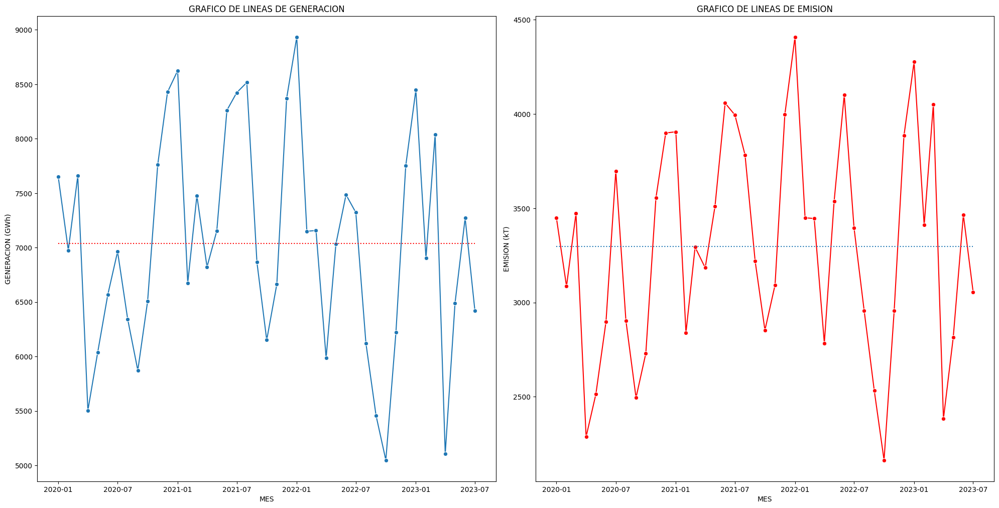

In [54]:
f, axs = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw=dict(width_ratios=[2, 2]))
sns.lineplot(data=agrup_mes, x="MES", y="GENERACION", ax=axs[0], marker = "o")
sns.lineplot(data=agrup_mes, x="MES", y=agrup_mes['GENERACION'].mean(), ax=axs[0], c="red", linestyle=":")
sns.lineplot(data=agrup_mes, x="MES", y="EMISION", ax=axs[1] , c="red", marker = "o")
sns.lineplot(data=agrup_mes, x="MES", y=agrup_mes['EMISION'].mean(), ax=axs[1], linestyle=":")
f.tight_layout()
axs[0].set_title('GRAFICO DE LINEAS DE GENERACION')
axs[1].set_title('GRAFICO DE LINEAS DE EMISION')
axs[0].set(ylabel='GENERACION (GWh)')
axs[1].set(ylabel='EMISION (kT)')
plt.show()
warnings.filterwarnings('ignore')

+ ##### Gráfico 2

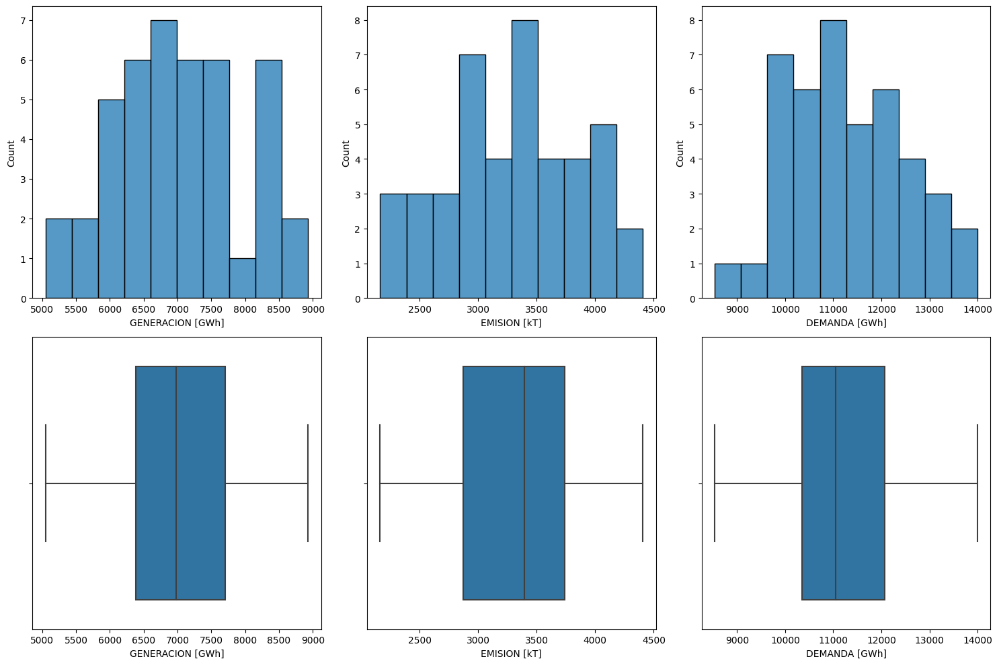

In [55]:
f, axs = plt.subplots(2, 3, figsize=(15, 10), gridspec_kw=dict(width_ratios=[2, 2, 2]))
sns.histplot(data=agrup_mes, x="GENERACION", ax=axs[0, 0], bins=10)
sns.boxplot(x=agrup_mes['GENERACION'], ax=axs[1, 0])
sns.histplot(data=agrup_mes, x="EMISION", ax=axs[0, 1], bins=10)
sns.boxplot(x=agrup_mes['EMISION'], ax=axs[1, 1])
sns.histplot(data=agrup_mes, x="DEMANDA", ax=axs[0, 2], bins=10)
sns.boxplot(x=agrup_mes['DEMANDA'], ax=axs[1, 2])
f.tight_layout()
axs[0, 0].set_xlabel('GENERACION [GWh]')
axs[1, 0].set_xlabel('GENERACION [GWh]')
axs[0, 1].set_xlabel('EMISION [kT]')
axs[1, 1].set_xlabel('EMISION [kT]')
axs[0, 2].set_xlabel('DEMANDA [GWh]')
axs[1, 2].set_xlabel('DEMANDA [GWh]')
warnings.filterwarnings('ignore')
plt.show()

+ ##### Gráfico 3

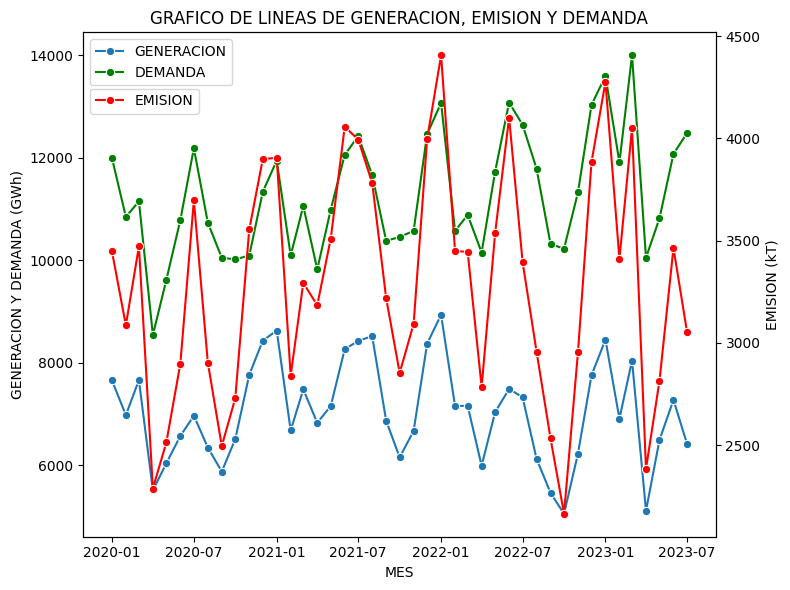

In [56]:
fig, ax1 = plt.subplots(figsize=(8, 6))
ax2 = ax1.twinx()
sns.lineplot(data=agrup_mes, x="MES", y="GENERACION", ax=ax1, marker = "o", label="GENERACION")
sns.lineplot(data=agrup_mes, x="MES", y="DEMANDA", ax=ax1 , c="green", marker = "o", label="DEMANDA")
sns.lineplot(data=agrup_mes, x="MES", y="EMISION", ax=ax2 , c="red", marker = "o", label="EMISION")
ax1.set_title('GRAFICO DE LINEAS DE GENERACION, EMISION Y DEMANDA')
ax1.set_xlabel('MES')
ax1.set_ylabel('GENERACION Y DEMANDA (GWh)')
ax2.set_ylabel('EMISION (kT)')
plt.legend(loc='upper left', bbox_to_anchor=(0, 0.902), ncol=3)
plt.tight_layout()
plt.show()
warnings.filterwarnings('ignore')

#### 2)¿La energía generada ha ido en aumento con el transcurso del tiempo? ¿Como fue el comportamiento de las emisiones como contrapartida?

De no mediar ningun hito importante en los meses que restan del 2023 y extrapolando mediante un calculo general por regla de tres, se podría estimar que en 2023 la generación rondaria los 83440 GWh y la emisión las 40200 toneladas de CO2.

Con la poca información en términos de años que se dispone, el gráfico 4 muestra que en los últimos 4 años no hay mayores cambios en lo generado, es decir no hay una tendencia marcada en términos de generación anual y por el lado de las emisiones habría una leve tendencia alcista al término del 2023.

+ ##### Gráfico 4

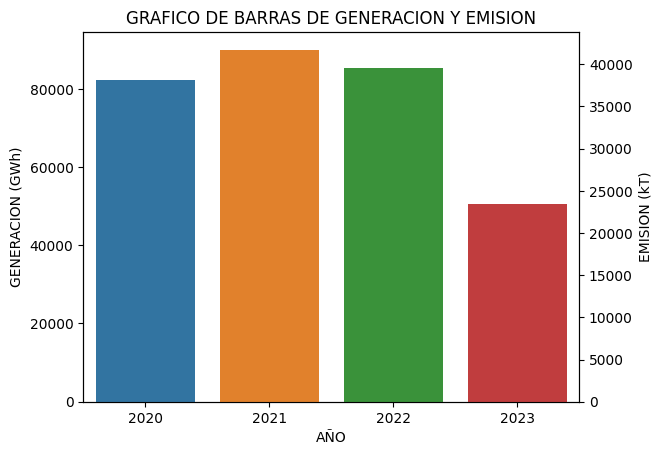

In [57]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.barplot(x=agrup_año['AÑO'], y=agrup_año['GENERACION'], data=agrup_mes, ax=ax1)
sns.barplot(x=agrup_año['AÑO'], y=agrup_año['EMISION'], data=agrup_mes, ax=ax2)
ax1.set_title('GRAFICO DE BARRAS DE GENERACION Y EMISION')
ax1.set_xlabel('AÑO')
ax1.set_ylabel('GENERACION (GWh)')
ax2.set_ylabel('EMISION (kT)')
plt.show()
warnings.filterwarnings('ignore')

In [58]:
agrup_año

,AÑO,EMISION,GENERACION
0,2020,36985.162,82263.412
1,2021,41726.275,89998.418
2,2022,39610.975,81662.408
3,2023,23453.381,48673.274


In [59]:
agrup_año[agrup_año.AÑO==2023].GENERACION/7*12, agrup_año[agrup_año.AÑO==2023].EMISION/7*12 #estimación de datos para año 2023

(3    83439.898286
 Name: GENERACION, dtype: float64,
 3    40205.796
 Name: EMISION, dtype: float64)

#### 3)¿Existe alguna relación entre las características cuantitativas?

El gráfico 5 muestra ordenes de correlación fuertemente positiva entre si para las variables CONSUMO, GENERACION y EMISION pero no se observa correlación entre la variable EMIGEN y el resto de las variables cuantitativas. Por otro lado la generación escalada por demanda también tiene una correlación positiva aunque no tan fuerte como los valores de las primeras variables mencionadas.

El gráfico 6 muestra la fuerte correlación positiva entre las variables GENERACION Y EMISION, el coeficiente de correlación de 0,95 del mapa de calor ya lo confirmaba y se observa que el combustible condiciona la pendiente de la curva notando que carbon mineral a priori genera más CO2 que el resto de los combustibles y que con el gas natural se genera más energía con el mismo nivel de emisión que gas oil y fuel oil.

In [60]:
labels_cuanti= ["AÑO","CONSUMO","GENERACION", "FACTORXCOMB", "EMISION","NUMEROMES","DEMANDA"] #lista de nombres de variables cuantitativas

+ ##### Feature Engineering

In [61]:
df2 = df[labels_cuanti] #se genera un df2 filtrando las variables cuantitativas de df para poder calcular matriz de correlación
#Feature Engineering --> generación de dos variables sinteticas en base al valor de otras variables
df2['EMIGEN'] = df2['EMISION']/df2['GENERACION'] #se crea la columna EMIGEN que es la variable que se quiere controlar
df2['GEN_SCALE'] = df2['GENERACION']/(df2['DEMANDA']*1000) #se crea la columna GEN_SCALE, escalanda la GENERACION con DEMANDA

+ ##### Gráfico 5

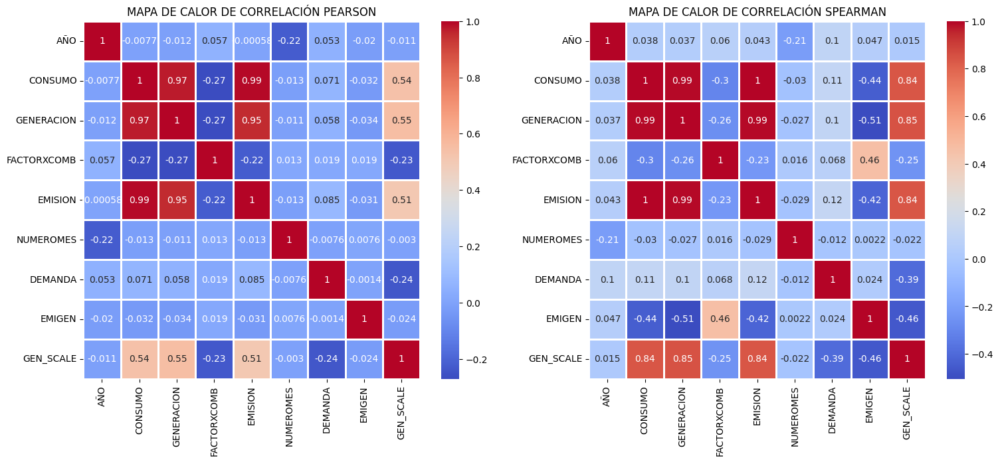

In [62]:
plt.figure(figsize=(18,7)) # Tamaño de la figura
plt.subplot(1,2,1)
heatmap = sns.heatmap(df2.corr('pearson'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN PEARSON")
plt.subplot(1,2,2)
heatmap = sns.heatmap(df2.corr('spearman'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN SPEARMAN")
plt.show()
warnings.filterwarnings('ignore')

+ ##### Gráfico 6

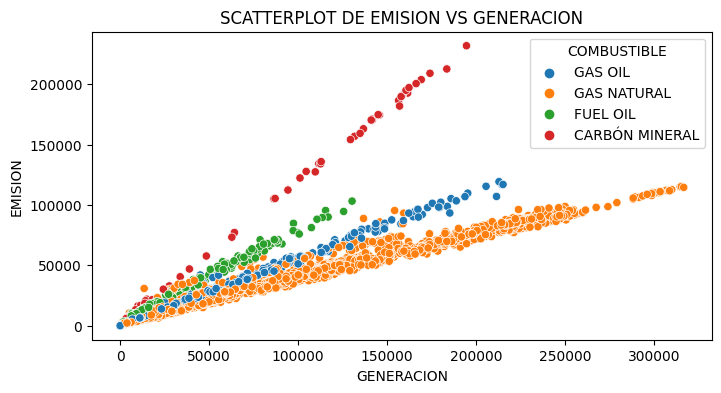

In [63]:
plt.figure(figsize=(8,4)) # Tamaño de la figura
sns.scatterplot(x='GENERACION', y='EMISION', hue='COMBUSTIBLE', data=df)
plt.title("SCATTERPLOT DE EMISION VS GENERACION")
plt.show()
warnings.filterwarnings('ignore')

#### 4)En base a los combustibles utilizados en el país, ¿existe una dependencia con alguno partícular por parte de las provincias? Y a nivel nacional como es la situación?

Se confirma que el gas natural es el combustible mayoritariamente utilizado para la generación de energía, con un 85% de participación en el total de los datos de generación (gráfico 7).

En cuanto a la dependencia de cada provincia con cada combustible (gráfico 8), lo que se observa es que muchas provincias dependen unicamente del gas oil (La Pampa, Chaco, Catamarca por ejemplo) mientras que en las que tienen más posibilidades de recursos lo más utilizado es el gas natural (Buenos Aires, Santa Fe, Mendoza por ejemplo). No todos tienen acceso al gas natural siguiendo con la lógica de la falta de inversión del país en infraestructura asociada y con respecto al carbón mineral solo dos provincias lo utilizan (Santa Cruz y Buenos Aires).

+ ##### Gráfico 7

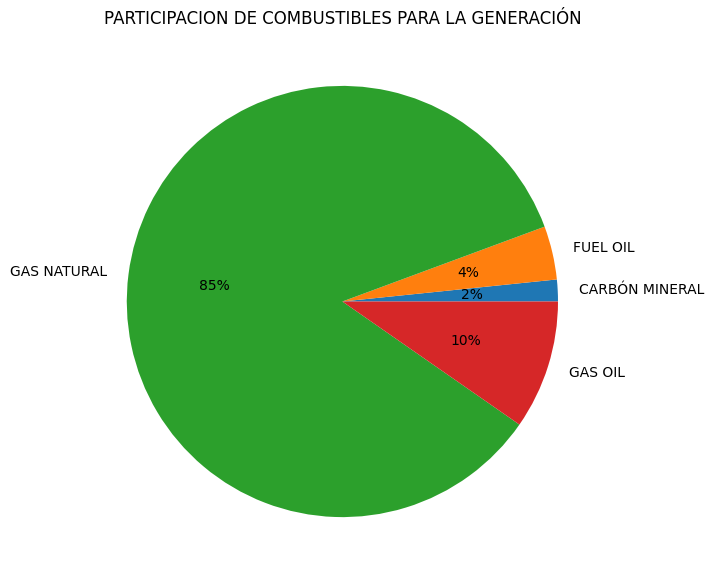

In [64]:
fig,ax = plt.subplots(figsize =(10, 7))
ax.pie(agrup_comb['GENERACION'], labels =agrup_comb.index, autopct='%1.f%%')
ax.set_title('PARTICIPACION DE COMBUSTIBLES PARA LA GENERACIÓN')
warnings.filterwarnings('ignore')

+ ##### Gráfico 8

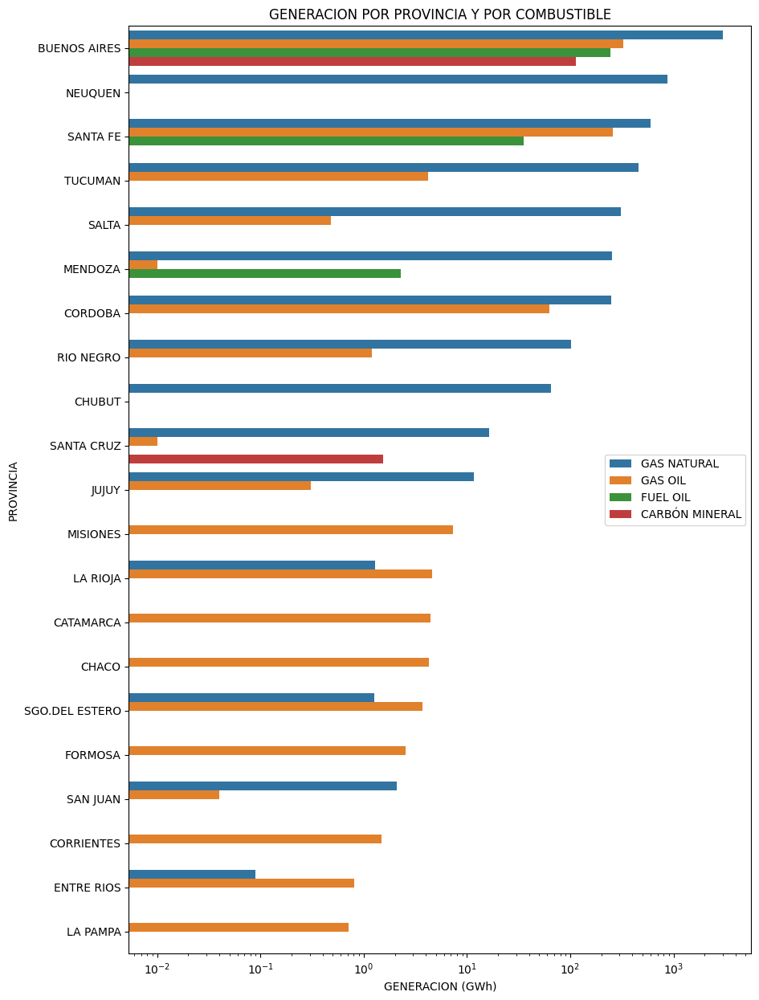

In [65]:
f, axs = plt.subplots(1,1, figsize=(10, 15))
sns.barplot(x=agrup_provcomb['GENERACION'], y=agrup_provcomb['PROVINCIA'], hue=agrup_provcomb['COMBUSTIBLE'], )
axs.set_title('GENERACION POR PROVINCIA Y POR COMBUSTIBLE')
axs.set(ylabel='PROVINCIA')
axs.set(xlabel='GENERACION (GWh)')
axs.legend(loc="center right")
axs.set_xscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.
warnings.filterwarnings('ignore')

#### 5)¿Como es el comportamiento mensual en términos de generación y emisión de cada provincia? Se observan hitos en algún mes puntual a lo largo de la historia?

Con los gráficos 9 y 11 la idea es visualizar como fue el comportamiento de las variables a lo largo de los meses de los cuales se tienen datos. En general pareciera haber ciertos comportamientos estacionales propios de las temperaturas ya que en función de como sea la integración/dependencia de los usuarios a la energía eléctrica podría suponer la necesidad de generar mas energía en los meses de verano para algunas provincias y lo mismo para los meses de invierno en otras provincias. De cualquier forma la fuerte correlación entre la emisión y la generación también queda manifestada en estos gráficos.

En los casos de las provincias de Buenos Aires, La Pampa, Córdoba, Santa Fe, Corrientes y Entre Rios se observan picos de generación en los meses de Verano e Invierno mientras que en los meses restantes el comportamiento es inverso. Se observa que en general en Verano es necesario generar mas energía que en invierno salvo en las provincias de Entre Rios y Santa Fe donde parecería ser mas alta la necesidad en Invierno. Esto último siempre hablando dentro de cada provincia en particular dado que los órdenes de los valores entre provincias son dispares.

Por otro lado para las provincias de Misiones, Chaco, Mendoza, La Rioja, San Juan, Catamarca, Santiago del Estero, Tucumán, Jujuy y Formosa la situación es mas demandante en Verano y es consistente dado que suelen manifestarse temperaturas más elevadas que la media del país durante todo el año y máximos en los meses de Enero y Diciembre.

Salta, Neuquén y Río Negro por su parte tienen un patrón con una cierta estabilidad sin picos marcados.

Lo que se observa claro en el gráfico 10, salvo algunas excepciones, es que los meses primaverales de septiembre/octubre y los meses otoñales de abril/mayo parecen ser lo más tranquilos en términos de necesidades, es decir órdenes bajos de generación para cada provincia particular.

En los gráficos también se visualiza variabilidad en los valores de cada provincia, y en algunos casos sera necesario evaluar si no se trata de outliers como por ejemplo Septiembre 2021 para el caso de Salta, Noviembre 2022 para el caso de Rio Negro, Mayo 2020 para Mendoza o Julio 2020 para Neuquén. Esto se puede visualizar mas claramente en el gráfico 9.

Los gráficos 11 y 12 permiten evaluar a lo largo del tiempo como fue el comportamiento de las provincias en términos relativos a la emisión por unidad de energía generada (variable EMIGEN) y acá ya se observa a priori lo que se intentará responder en la pregunta siguiente de cual provincia es la mas eficiente. Por los valores de la variable, Salta parece ser la provincia en consideración con valores en torno a los 0,39 en general (debajo de las medianas de las demás provincias) para todos meses. En Enero 2022 habrá que chequear la existencia de outlier ya que hay un pico muy marcado lo cual no se corresponde con las mediciones normales para el resto de los meses.

+ ##### Gráfico 9

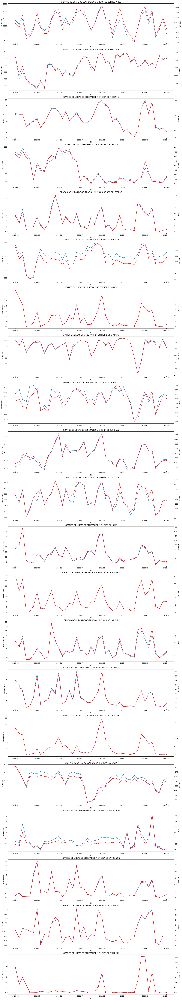

In [66]:
PROVINCIAS = df1.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  ax1 = plt.subplot(len(PROVINCIAS),1,i+1)
  ax2 = ax1.twinx()
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].GENERACION, ax=ax1, marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMISION, ax=ax2, c="red", marker = "o")
  plt.title('GRAFICO DE LINEAS DE GENERACION Y EMISION DE '+j)
  plt.xlabel('')

+ ##### Gráfico 10

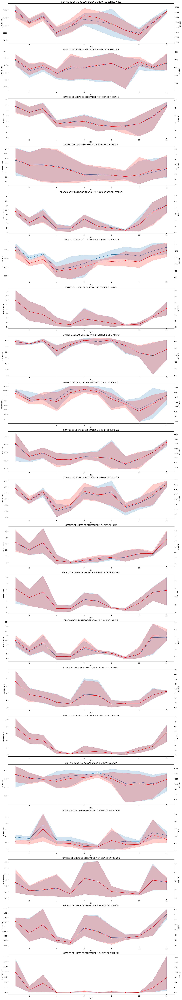

In [67]:
PROVINCIAS = df1.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  ax1 = plt.subplot(len(PROVINCIAS),1,i+1)
  ax2 = ax1.twinx()
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].GENERACION, ax=ax1, marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMISION, ax=ax2, c="red", marker = "o")
  plt.title('GRAFICO DE LINEAS DE GENERACION Y EMISION DE '+j)
  plt.xlabel('')

+ ##### Gráfico 11

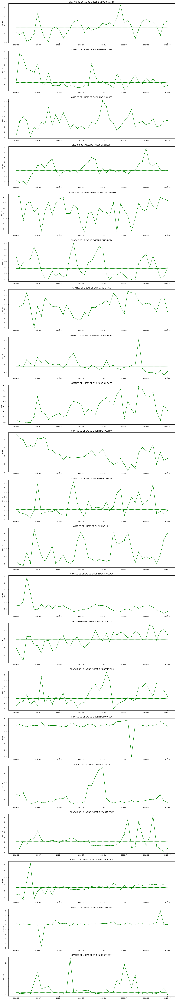

In [68]:
PROVINCIAS = df.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  plt.subplot(len(PROVINCIAS),1,i+1)
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN, c="green", marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN.median(), c="green", linestyle="--")
  plt.title('GRAFICO DE LINEAS DE EMIGEN DE '+j)
  plt.xlabel('')

+ ##### Gráfico 12

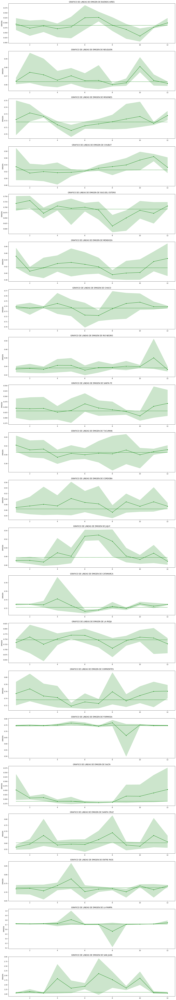

In [69]:
PROVINCIAS = df.PROVINCIA.unique()
plt.figure(figsize=(20,120))
for i,j in zip(range(len(PROVINCIAS)),PROVINCIAS):
  plt.subplot(len(PROVINCIAS),1,i+1)
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN, c="green", marker = "o")
  sns.lineplot(data=agrup_mesprov, x=agrup_mesprov.MES.dt.month, y=agrup_mesprov[agrup_mesprov.PROVINCIA == j].EMIGEN.median(), c="green", linestyle="--")
  plt.title('GRAFICO DE LINEAS DE EMIGEN DE '+j)
  plt.xlabel('')

#### 6)¿Cual es la provincia que más genera y emite en términos absolutos? Y ¿cual es la que menos lo hace? Se puede anticipar en base a los datos cual es la mas eficiente?

Para continuar se intentará determinar cual es la provincia que genera menor contaminación por unidad de energía generada. Es decir que es mas eficiente. Para ello en base al gráfico 13, se ordenó a las provincias de menor a mayor en función de su relación de Toneladas de CO2 por GWh generado por mes. A partir de aquí se visualiza en principio lo mencionado antes que Salta es la provincia más eficiente y por otro lado en el gráfico 14 se observa que Buenos Aires es la provincia que mas energía genera pero así también la que mas contamina en términos absolutos.

+ ##### Gráfico 13

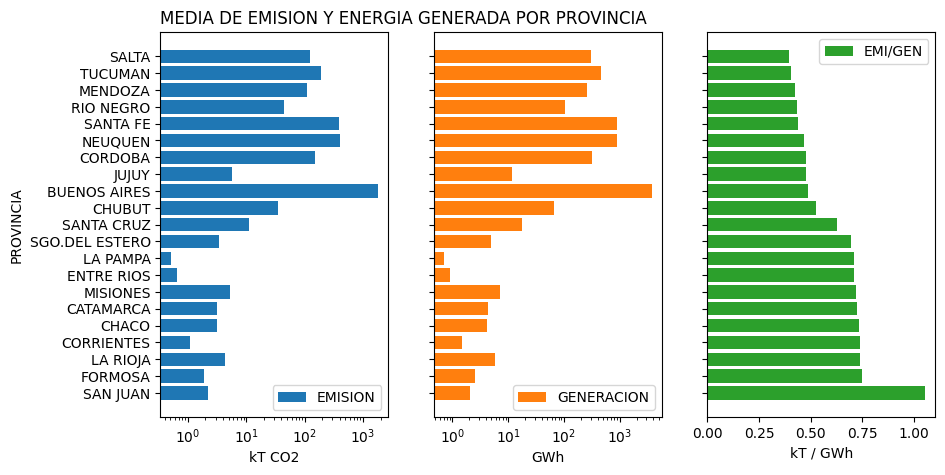

In [70]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 5), sharex=False, sharey=True)
ax[0].barh(agrup_prov.index, agrup_prov['EMISION'], label='EMISION')
ax[1].barh(agrup_prov.index, agrup_prov['GENERACION'], label='GENERACION', color='C1')
ax[2].barh(agrup_prov.index, agrup_prov['EMISION/GENERACION'], label='EMI/GEN', color='C2')
ax[0].set_title('MEDIA DE EMISION Y ENERGIA GENERADA POR PROVINCIA', loc='left')
ax[2].set_xlabel('kT / GWh')
ax[1].set_xlabel('GWh')
ax[0].set_xlabel('kT CO2')
ax[0].set_ylabel('PROVINCIA')
ax[2].legend()
ax[0].legend()
ax[1].legend()
ax[0].set_xscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.
ax[1].set_xscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.

+ ##### Gráfico 14

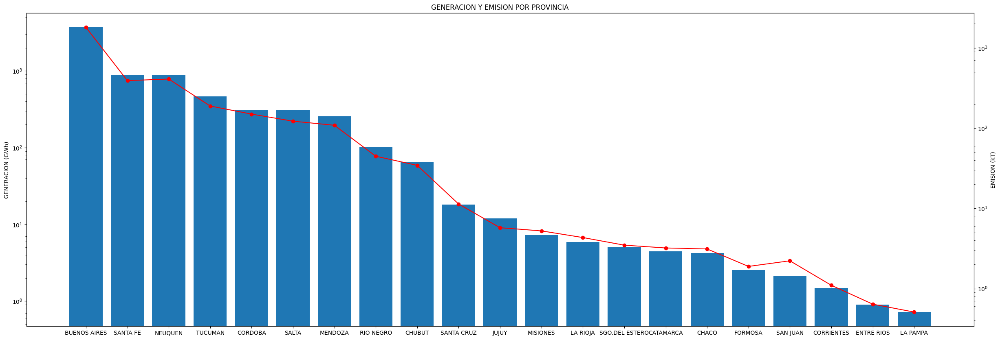

In [71]:
y= agrup_prov.sort_values(by =['GENERACION'], ascending=False)
fig,ax = plt.subplots(figsize =(30, 10))
ax1 = ax.twinx()
ax.bar(y.index, y['GENERACION'])
ax1.plot(y.index, y['EMISION'], c="r", marker="o")
ax1.set_title('GENERACION Y EMISION POR PROVINCIA')
ax.set_ylabel('GENERACION (GWh)')
ax1.set_ylabel('EMISION (kT)')
ax.set_yscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.
ax1.set_yscale("log") #se define escala logaritmica para poder representar los bajos valores de algunas provincias.

#### 7)¿Se pueden identificar valores atípicos/anormales en los datos disponibles que puedan generar algún tipo de distorsión?

Se utilizó la medida de cálculo zscore para determinar en función de su valor si la variable EMIGEN presenta valores atípicos. Los cálculos determinaron que la cantidad de outliers sobre el total de registros disponibles es despreciable (0,22%). Luego se hizo una segunda evaluación de outliers, mediante distancia euclidea, y la proporción de estos datos resultó cercana al 2%, aun siendo poco significante  por lo que se decide eliminar estos registros dejando el datasets totalmente depurado.

In [72]:
df['EMIGEN'] = df['EMISION']/df['GENERACION'] #se crea la columna EMIGEN en el datasets depurado
df['GEN_SCALE'] = df['GENERACION']/(df['DEMANDA']*1000) #se crea la columna GEN_SCALE en el datasets depurado

In [73]:
data_z = pd.DataFrame()

In [74]:
for j in df.columns[12:]:
  data_z[j] = (df[j] - df[j].mean()) / df[j].std() #calculo de zscore para variables cuantitativas
data_z.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,NUMEROMES,DEMANDA,EMIGEN,GEN_SCALE
0,-0.429767,-0.407161,0.744932,-0.435527,-1.479673,1.057617,-0.018314,-0.273158
1,-0.415043,-0.396103,0.744932,-0.416215,-1.479673,1.057617,-0.016814,-0.272405
2,0.846424,0.589472,-0.943478,0.771957,-1.479673,-1.019789,-0.069277,1.745808
3,0.801788,0.699563,-0.943478,0.729670,-1.479673,-1.019789,-0.084993,1.968151
4,0.795687,0.698763,-0.943478,0.723891,-1.479673,-1.019789,-0.085434,1.966535


In [75]:
# definición si un registro es outliers en funcion del valor de zcore de EMIGEN
data_z['EMIGEN_x']= data_z['EMIGEN'].apply(lambda x: 'Atipico' if (x>2 or x<-2) else 'Normal')
data_z.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,NUMEROMES,DEMANDA,EMIGEN,GEN_SCALE,EMIGEN_x
0,-0.429767,-0.407161,0.744932,-0.435527,-1.479673,1.057617,-0.018314,-0.273158,Normal
1,-0.415043,-0.396103,0.744932,-0.416215,-1.479673,1.057617,-0.016814,-0.272405,Normal
2,0.846424,0.589472,-0.943478,0.771957,-1.479673,-1.019789,-0.069277,1.745808,Normal
3,0.801788,0.699563,-0.943478,0.729670,-1.479673,-1.019789,-0.084993,1.968151,Normal
4,0.795687,0.698763,-0.943478,0.723891,-1.479673,-1.019789,-0.085434,1.966535,Normal


In [76]:
data_z['EMIGEN_x'].value_counts(), round(data_z['EMIGEN_x'].value_counts()/len(data_z.index)*100,2) #cantidad y proporcion de outliers

(EMIGEN_x
 Normal     15929
 Atipico       35
 Name: count, dtype: int64,
 EMIGEN_x
 Normal     99.78
 Atipico     0.22
 Name: count, dtype: float64)

In [77]:
labels_cuanti= ["CONSUMO","GENERACION", "FACTORXCOMB", "EMISION", "NUMEROMES","DEMANDA","EMIGEN", "GEN_SCALE","EMIGEN_x"]
colorPalette = {'Normal':'blue', 'Atipico':'red'}

+ ##### Gráfico 15

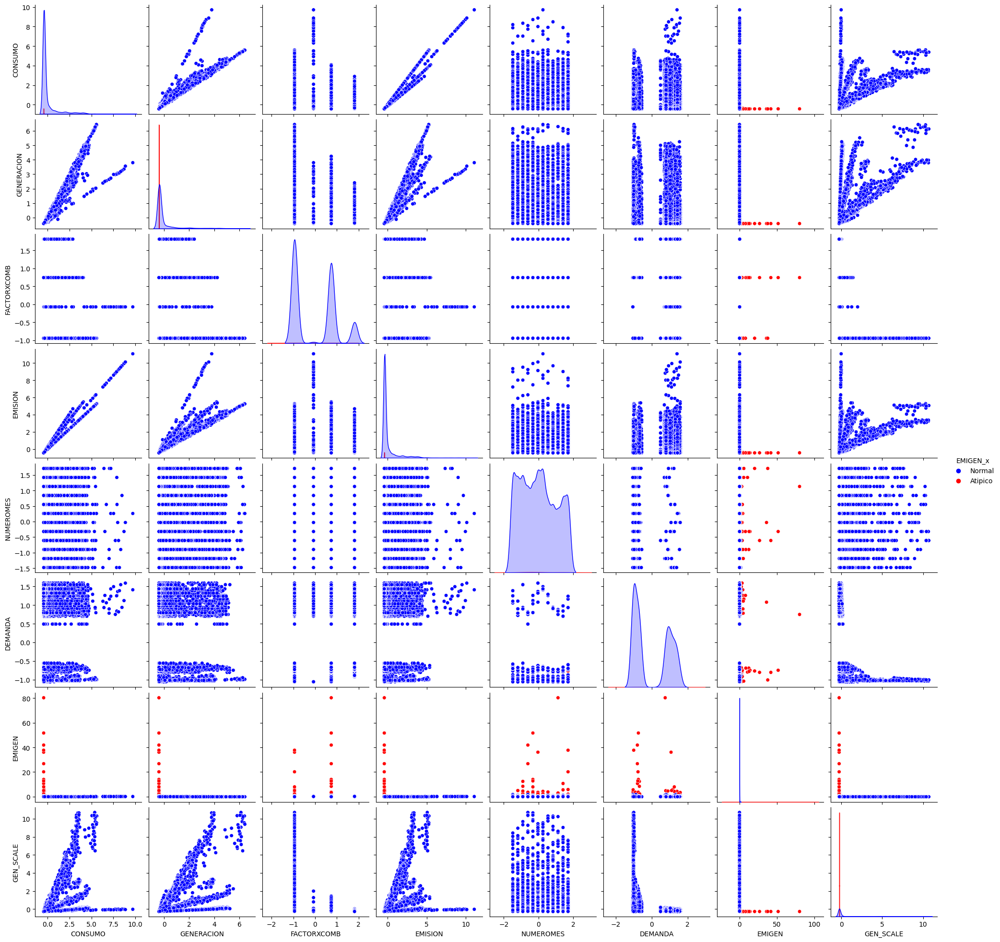

In [78]:
sns.pairplot(data_z[labels_cuanti], hue='EMIGEN_x', palette=colorPalette, plot_kws = {'s': 30})
# mostramos el grafico
plt.show()
plt.close('all')
warnings.filterwarnings('ignore')

In [79]:
data_multiple=data_z.drop(columns=['EMIGEN_x'])
data_multiple.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,NUMEROMES,DEMANDA,EMIGEN,GEN_SCALE
0,-0.429767,-0.407161,0.744932,-0.435527,-1.479673,1.057617,-0.018314,-0.273158
1,-0.415043,-0.396103,0.744932,-0.416215,-1.479673,1.057617,-0.016814,-0.272405
2,0.846424,0.589472,-0.943478,0.771957,-1.479673,-1.019789,-0.069277,1.745808
3,0.801788,0.699563,-0.943478,0.729670,-1.479673,-1.019789,-0.084993,1.968151
4,0.795687,0.698763,-0.943478,0.723891,-1.479673,-1.019789,-0.085434,1.966535


In [80]:
#se define fórmula que retorna valor 1 si el dato es outlier y 0 si no lo es mediante calculo de distancia euclídea
def outlier_euclideano_d(x,cutoff):# x: dataframe con valors numericos normalizados
  result_ = pd.Series([0] * len(x), index=x.index)
  data_mean = x.mean() # media de los datos_
  dist = np.sqrt(np.sum(((x-data_mean) ** 2),axis=1)) #Distancia euclideana
  dist_mean = dist.mean() #media de las distancia
  dist_zscore = np.abs((dist - dist_mean) / dist.std())#z-score para las distancias
  result_[((dist_zscore > cutoff))] = 1
  return result_

In [81]:
euc_d = data_multiple.copy()
euc_d

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,NUMEROMES,DEMANDA,EMIGEN,GEN_SCALE
0,-0.429767,-0.407161,0.744932,-0.435527,-1.479673,1.057617,-0.018314,-0.273158
1,-0.415043,-0.396103,0.744932,-0.416215,-1.479673,1.057617,-0.016814,-0.272405
2,0.846424,0.589472,-0.943478,0.771957,-1.479673,-1.019789,-0.069277,1.745808
3,0.801788,0.699563,-0.943478,0.729670,-1.479673,-1.019789,-0.084993,1.968151
4,0.795687,0.698763,-0.943478,0.723891,-1.479673,-1.019789,-0.085434,1.966535
...,...,...,...,...,...,...,...,...
15959,2.204365,2.517227,-0.943478,2.058393,0.259419,1.435073,-0.104930,-0.103743
15960,0.946602,1.030922,0.744932,1.369644,0.259419,1.435073,-0.065001,-0.189864
15961,2.008669,2.278350,-0.943478,1.873001,0.259419,1.435073,-0.104246,-0.117585
15962,1.235963,1.344205,0.744932,1.749153,0.259419,1.435073,-0.065796,-0.171711


In [82]:
# Aplicar la funcion
euc_d['outlier']=outlier_euclideano_d(euc_d,3)
euc_d.head()

,CONSUMO,GENERACION,FACTORXCOMB,EMISION,NUMEROMES,DEMANDA,EMIGEN,GEN_SCALE,outlier
0,-0.429767,-0.407161,0.744932,-0.435527,-1.479673,1.057617,-0.018314,-0.273158,0
1,-0.415043,-0.396103,0.744932,-0.416215,-1.479673,1.057617,-0.016814,-0.272405,0
2,0.846424,0.589472,-0.943478,0.771957,-1.479673,-1.019789,-0.069277,1.745808,0
3,0.801788,0.699563,-0.943478,0.729670,-1.479673,-1.019789,-0.084993,1.968151,0
4,0.795687,0.698763,-0.943478,0.723891,-1.479673,-1.019789,-0.085434,1.966535,0


+ ##### Gráfico 16

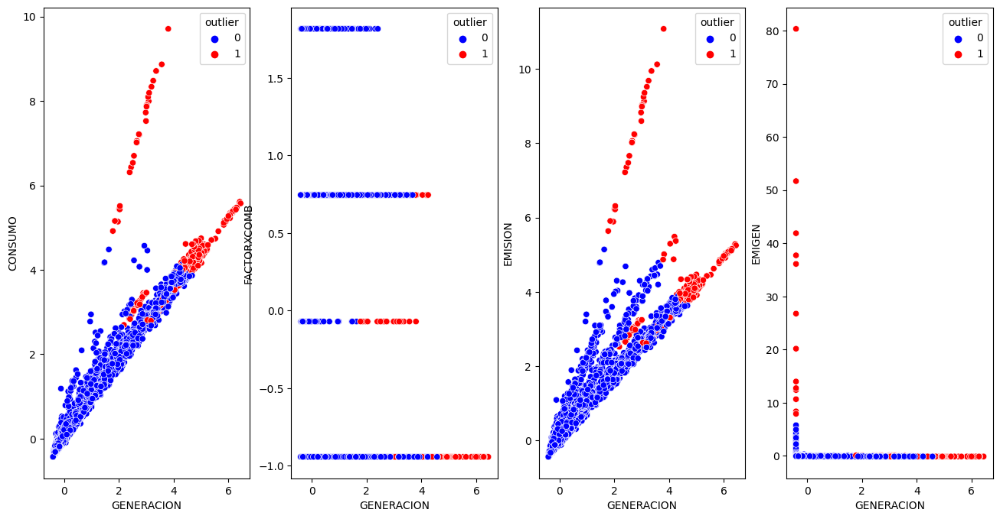

In [83]:
#no se grafica para GEN_SCALE porque es mismo comportamiento que GENERACION
plt.figure(figsize=(16,8))
plt.subplot(1,4,1)
sns.scatterplot(x="GENERACION",y="CONSUMO",data=euc_d,hue="outlier",palette=["blue","red"])
plt.subplot(1,4,2)
sns.scatterplot(x="GENERACION",y="FACTORXCOMB",data=euc_d,hue="outlier",palette=["blue","red"])
plt.subplot(1,4,3)
sns.scatterplot(x="GENERACION",y="EMISION",data=euc_d,hue="outlier",palette=["blue","red"])
plt.subplot(1,4,4)
sns.scatterplot(x="GENERACION",y="EMIGEN",data=euc_d,hue="outlier",palette=["blue","red"])
warnings.filterwarnings('ignore')

In [84]:
euc_d['outlier'].value_counts(), round(euc_d['outlier'].value_counts()/len(euc_d.index)*100,2) #cantidad y proporcion de outliers

(outlier
 0    15643
 1      321
 Name: count, dtype: int64,
 outlier
 0    97.99
 1     2.01
 Name: count, dtype: float64)

In [85]:
indicesatip = euc_d[euc_d.outlier==1].index #se determinan los indices de los registros con valores atipicos

In [86]:
print(df.shape)
dflimpio=df.drop(indicesatip, axis=0) #se eliminan en el dataset depurado de valores incorrectos los registros con valores atipicos
print(dflimpio.shape)

(15964, 20)
(15643, 20)


In [87]:
dflimpio.head(5)

,AÑO,MES,MAQUINA,CENTRAL,AGENTE,AGENTE DESCRIPCION,REGION,PROVINCIA,TIPOMAQ,FUENTEGEN,TECNOLOGIA,COMBUSTIBLE,CONSUMO,GENERACION,FACTORXCOMB,EMISION,NUMEROMES,DEMANDA,EMIGEN,GEN_SCALE
0,2020,2020-01-01,9JULDI01,9JUL,CMOREN1G,COOP. MNO. MORENO BS. AS.GENER,BUENOS AIRES,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,40.544,145.245,2.697171,109.354083,1,5609.8,0.752894,0.000026
1,2020,2020-01-01,ABRODI01,ABRO,CTBROWNG,C.T. ALMIRANTE BROWN,GRAN BS.AS.,BUENOS AIRES,MOTOR DIESEL,Térmica,DI,GAS OIL,184.748,656.097,2.697171,498.296865,1,5609.8,0.759487,0.000117
2,2020,2020-01-01,ACAJCC01,CAPE,CAPEX-QA,CAPEX S.A. AUTOGENERADOR,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12538.960,46187.020,1.948196,24428.350713,1,189.2,0.528901,0.244117
3,2020,2020-01-01,ACAJCC02,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12101.809,51272.911,1.948196,23576.694918,1,189.2,0.459828,0.270998
4,2020,2020-01-01,ACAJCC03,ACAJ,CAPEXSAG,C.T. AGUA DEL CAJON,COMAHUE,NEUQUEN,CICLO COMBINADO,Térmica,CC,GAS NATURAL,12042.061,51235.952,1.948196,23460.294109,1,189.2,0.457887,0.270803


+ ##### Gráfico 17

In [88]:
labels_cuanti= ["CONSUMO","GENERACION", "FACTORXCOMB", "EMISION", "NUMEROMES","DEMANDA","EMIGEN", "GEN_SCALE"]

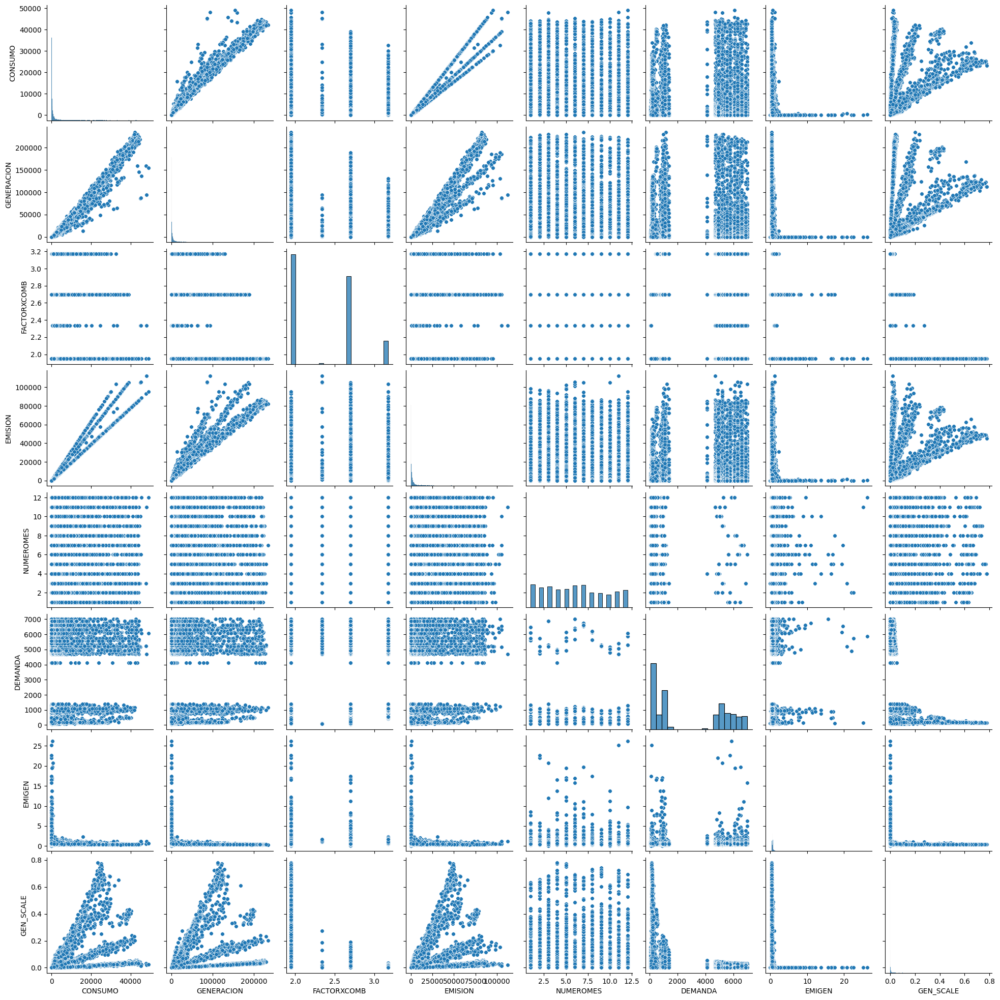

In [89]:
sns.pairplot(dflimpio[labels_cuanti], palette=colorPalette, plot_kws = {'s': 30})
# mostramos el grafico
plt.show()
plt.close('all')
warnings.filterwarnings('ignore')

+ ##### Gráfico 18

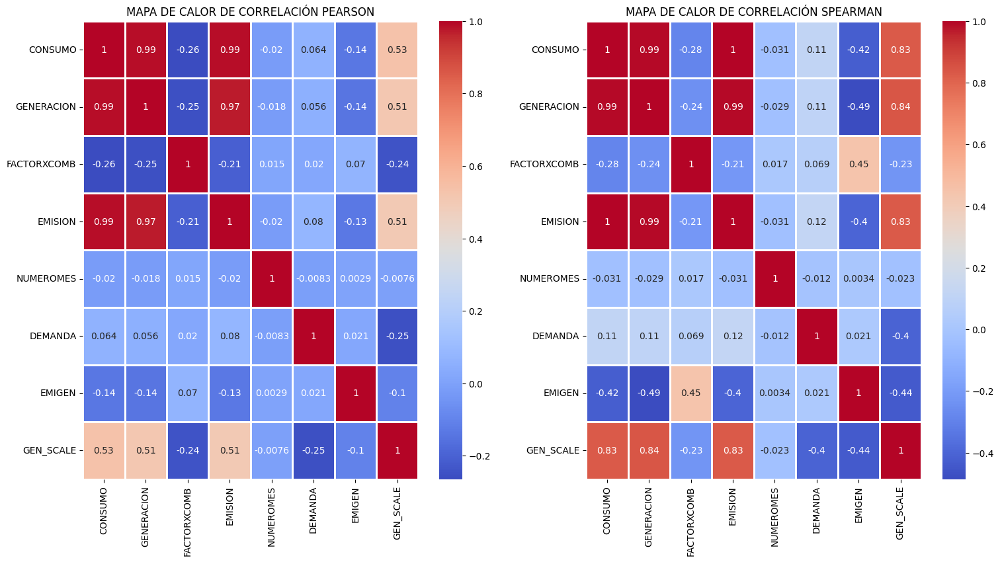

In [90]:
#se vuelve a graficar la matriz de correlación para ver si se modificaron los valores respecto a la versión previa pero no hay cambios significativos dada la baja proporción de datos eliminados
plt.figure(figsize=(18,9))
plt.subplot(1,2,1)
heatmap = sns.heatmap(dflimpio[labels_cuanti].corr('pearson'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN PEARSON")
plt.subplot(1,2,2)
heatmap = sns.heatmap(dflimpio[labels_cuanti].corr('spearman'), annot=True, cmap="coolwarm", linewidths=1)
plt.title("MAPA DE CALOR DE CORRELACIÓN SPEARMAN")
plt.show()
warnings.filterwarnings('ignore')

#### 8)¿Hay estacionalidad en la demanda durante el año?

Como la lógica lo indica, el gráfico 19 muestra que hay la demanda también tiene estacionalidad a lo largo del año. Al igual que la GENERACION, hay picos de mayor demanda en los meses de ENERO, JULIO y DICIEMBRE.

+ ##### Gráfico 19

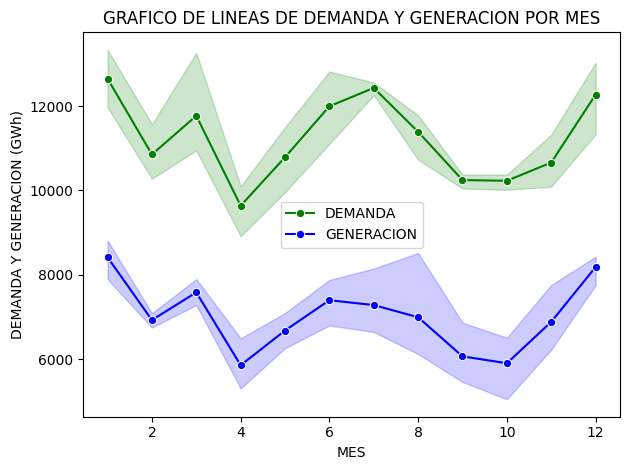

In [91]:
fig, ax1 = plt.subplots()
sns.lineplot(data=agrup_mes, x="NUMEROMES", y="DEMANDA", marker = "o", color="g", label="DEMANDA")
sns.lineplot(data=agrup_mes, x="NUMEROMES", y="GENERACION" , marker = "o", color="b", label="GENERACION")
ax1.set_title('GRAFICO DE LINEAS DE DEMANDA Y GENERACION POR MES')
ax1.set_xlabel('MES')
ax1.set_ylabel('DEMANDA Y GENERACION (GWh)')
plt.tight_layout()
plt.legend(loc='center', ncol=1)
plt.show()
warnings.filterwarnings('ignore')

#### 9)¿Como se comporta la demanda y generación según la región y las provincias del país?

El gráfico 20 muestra que si la demanda corresponde al área de buenos aires y gran buenos aires, los valores mensuales de esta variable siempre estan por arriba de los 4000 GWh miientras que para el resto de las provincias los valores se encuentran por debajo de los 1500 GWh mensuales.

Analizando la información de demanda por provincia (gráfico 21), se observan grupos de demanda mensual mayor a 4000 GWh (Buenos Aires), demanda mensual entre 600 GWh y 1500 GWh aproximadamente (Santa Fe y Córdoba) y demanda mensual menor a 600 GWh para el resto de las provincias. De cualquier manera los datos están muy desbalanceados como se vió anteriormente.

+ ##### Gráfico 20

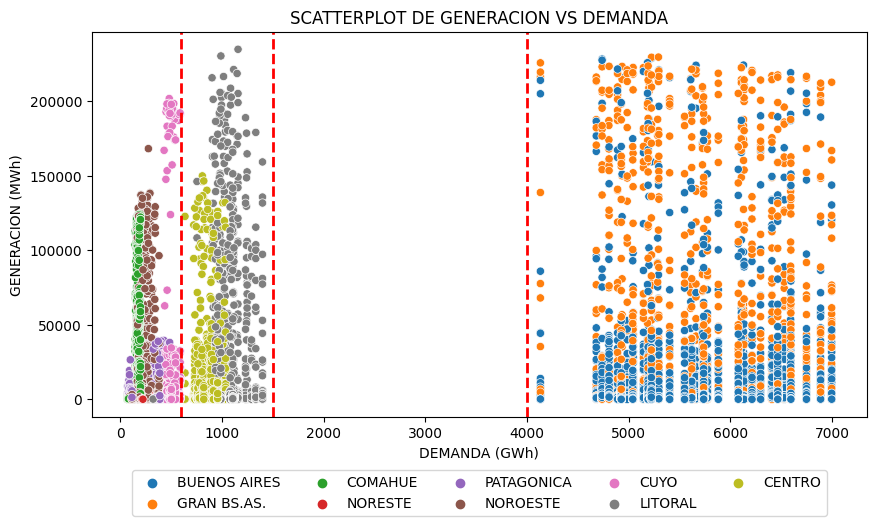

In [92]:
plt.figure(figsize=(10,5)) # Tamaño de la figura
sns.scatterplot(x='DEMANDA', y='GENERACION', hue='REGION', data=dflimpio)
plt.title("SCATTERPLOT DE GENERACION VS DEMANDA")
plt.xlabel('DEMANDA (GWh)')
plt.ylabel('GENERACION (MWh)')
plt.axvline(x=600, color='red', linestyle='--', linewidth=2)
plt.axvline(x=1500, color='red', linestyle='--', linewidth=2)
plt.axvline(x=4000, color='red', linestyle='--', linewidth=2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=5)
plt.show()
warnings.filterwarnings('ignore')

+ ##### Gráfico 21

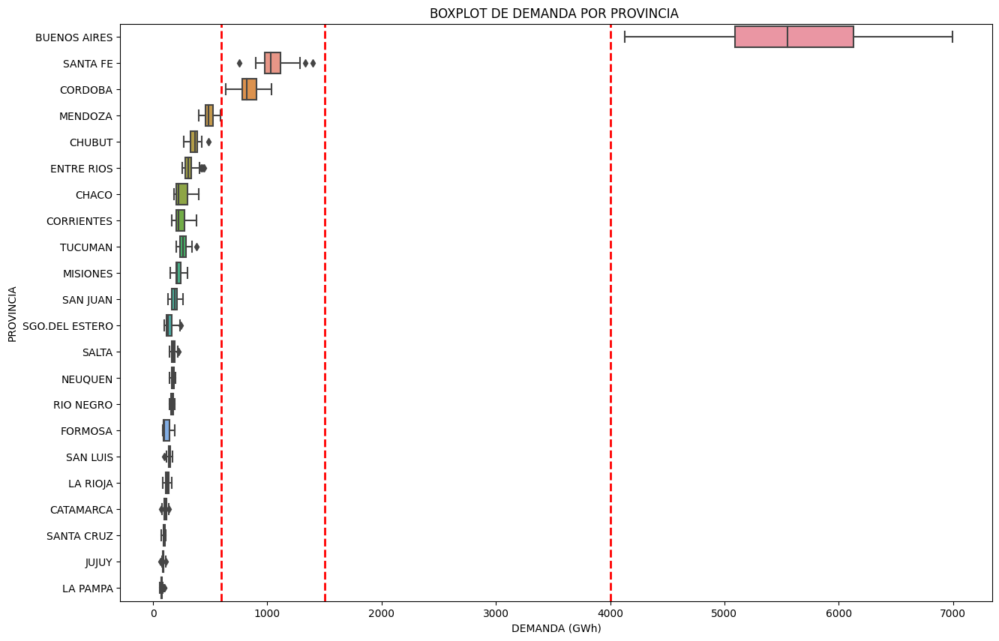

In [93]:
plt.figure(figsize=(15, 10))
dfaux_melt_group_sorted = dfaux_melt_group.sort_values(by='DEMANDA', ascending=False)
x = sns.boxplot(x=dfaux_melt_group_sorted['DEMANDA'], y=dfaux_melt_group_sorted['PROVINCIA'])
plt.axvline(x=600, color='red', linestyle='--', linewidth=2)
plt.axvline(x=1500, color='red', linestyle='--', linewidth=2)
plt.axvline(x=4000, color='red', linestyle='--', linewidth=2)
plt.title("BOXPLOT DE DEMANDA POR PROVINCIA ")
plt.xlabel("DEMANDA (GWh)")
plt.ylabel("PROVINCIA")
plt.show()
warnings.filterwarnings('ignore')

##### [Volver al índice](#seccion-1)

#### **9. Insights** <a id='seccion-10'></a>

Del análisis exploratorio de datos se pueden resumir los siguientes hallazgos:

-El gas natural es el combustible más utilizado (85%) para la generación de energía del universo de máquinas con emisiones.

-Excasa presencia de valores atípicos en las mediciones y perfecta disponibilidad de datos.

-No hubo crecimiento de la generación en los últimos años y una leve tendencia positiva en las emisiones.

-Fuerte correlación positiva entre la variable generación y la variable emisión. Es decir que si crece la generación también lo hacen las emisiones. La variable consumo, también tiene fuerte correlación positiva con las anteriores.

-El combustible utilizado para la generación condiciona la pendiente de la correlación anterior, siendo mas sustentable con el gas natural y menos sustentable el carbon mineral. Es decir, para un determinado nivel de generación se consiguen menos emisiones con gas natural que con el resto.

-Durante el año se ve marcada la estacionalidad en los datos. En general se observan picos de generación, emisión y demanda en los meses de Verano e Invierno mientras que en los meses restantes el comportamiento es inverso.

-Los meses primaverales de septiembre/octubre y los meses otoñales de abril/mayo son los más tranquilos en términos de necesidades, es decir órdenes bajos de generación para cada provincia particular.

-Salta es las provincia más sustentable y San Juan es la menos eficiente.

-Significativa diferencia en el orden de demanda mensual de la provincia de Buenos con valores superiores a los 4000 GWh mensuales. Se pueden identificar dos grupos mas de demanda. Santa Fe y Cordoba con demandas entre 600 GWh y los 1500 GWh mensuales y el resto de las provincias con demandas por debajo de los 600 GWh.

##### [Volver al índice](#seccion-1)

#### **10. Feature Selection** <a id='seccion-11'></a>

Se aplicarán dos modelos para realizar feature selection de variables categóricas y dos modelos para variables cuantitativas que permitan identificar las caracteristicas más importantes que permitan predecir la variable target PROVINCIA.

##### • SelectKBest

Se utiliza un algoritmo SelectKbest con prueba chi2 para seleccionar features categoricas importantes para predecir la PROVINCIA.

In [94]:
categorical_features = dflimpio.select_dtypes(include=['object']) #selecciono variables categóricas
categorical_features = categorical_features.drop(columns=["PROVINCIA","MAQUINA","AGENTE","CENTRAL","AGENTE DESCRIPCION"], axis=1)

In [95]:
X = pd.get_dummies(categorical_features, drop_first=True)  # categorical feature matrix
y = dflimpio['PROVINCIA'] #variable target

In [96]:
#se transforma los dataframes anterior en arrays para poder aplicar el modelo
X_array= X.values
y_array= y.values

In [97]:
chi2 = SelectKBest(score_func=chi2, k=10) #se inicializa model
X_selected = chi2.fit_transform(X_array, y_array) #se entrena el modelo d

In [98]:
selected_indices = chi2.get_support(indices=True) #se obtienen los indidces de variables seleccionadas por el modelo chi2

In [99]:
selected_feature_names = X.columns[selected_indices] #se filtran los nombres de las columnas cuyas variables son seleccionadas


In [100]:
print("Número de características originales:", X.shape[1])
print("Número de características seleccionadas:", X_selected.shape[1])

Número de características originales: 21
Número de características seleccionadas: 10


In [101]:
print("Nombres de las características seleccionadas:")
print(selected_feature_names)

Nombres de las características seleccionadas:
Index(['REGION_CENTRO', 'REGION_COMAHUE', 'REGION_CUYO', 'REGION_GRAN BS.AS.',
       'REGION_LITORAL', 'REGION_NORESTE', 'REGION_NOROESTE',
       'REGION_PATAGONICA', 'TIPOMAQ_MOTOR DIESEL', 'TECNOLOGIA_DI'],
      dtype='object')


In [102]:
model = RandomForestClassifier()# se inicializa un modelo RF que se utilizara para entrenar un modelo con las características seleccionadas
model.fit(X[selected_feature_names], y) # se entrena el modelo con las características seleccionadas
score_selected = model.score(X[selected_feature_names], y) # se calcula el score del modelo
print("Score del modelo con las características seleccionadas:", score_selected)

Score del modelo con las características seleccionadas: 0.8584670459630506


##### • SelectFromModel

Se utiliza un algoritmo SelectFromModel para seleccionar features categoricos importantes para predecir la PROVINCIA.

In [103]:
categorical_features = dflimpio.select_dtypes(include=['object']) #selecciono variables categóricas
categorical_features = categorical_features.drop(columns=["PROVINCIA","MAQUINA","AGENTE","CENTRAL","AGENTE DESCRIPCION"], axis=1)

In [104]:
X = pd.get_dummies(categorical_features, drop_first=True)  # categorical feature matrix
y = dflimpio['PROVINCIA'] #variable target

In [105]:
model = RandomForestClassifier()# se vuelve a inicializar un modelo RF
model.fit(X, y)

sfm = SelectFromModel(model, threshold='mean')  # Seleccionar características más importantes usando SelectFromModel
sfm.fit(X, y)

X_selected = sfm.transform(X) # se obtienen las características seleccionadas

print("Número de características originales:", X.shape[1])
print("Número de características seleccionadas:", X_selected.shape[1])

Número de características originales: 21
Número de características seleccionadas: 8


In [106]:
X_selected = sfm.get_support() # se obtienen las características seleccionadas

selected_indices = [i for i, x in enumerate(X_selected) if x] # se obtienen los índices de las características seleccionadas

# Obtener los nombres de las características seleccionadas
selected_feature_names = X.columns[selected_indices]

# Mostrar las características seleccionadas
print("Características seleccionadas:")
for feature in selected_feature_names:
    print(feature)

Características seleccionadas:
REGION_CENTRO
REGION_COMAHUE
REGION_CUYO
REGION_GRAN BS.AS.
REGION_LITORAL
REGION_NORESTE
REGION_NOROESTE
REGION_PATAGONICA


In [107]:
model.fit(X[selected_feature_names], y) # se entrena el modelo con las características seleccionadas
score_selected = model.score(X[selected_feature_names], y) # se calcula el score del modelo
print("Score del modelo con las características seleccionadas:", score_selected)

Score del modelo con las características seleccionadas: 0.8335996931534871


##### • RFECV

Se utiliza un algoritmo RFECV (Recursive Feature Elimination with Cross-Validation) para seleccionar features cuantitativas más importantes para predecir la PROVINCIA.

In [108]:
features = listalabels= ["MAQUINA", "MES", "CENTRAL", "AGENTE", "PROVINCIA", "AGENTE DESCRIPCION","PROVINCIA", "COMBUSTIBLE", "REGION", "TIPOMAQ", "FUENTEGEN", "TECNOLOGIA","DEMANDA"]

In [109]:
X = dflimpio.drop(features, axis=1)       # quantitative feature matrix
y = dflimpio['PROVINCIA']

In [110]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # se separa el dataset en uno de entrenamiento y otro de test

In [111]:
estimator=RandomForestClassifier(random_state=1) #se inicializa un modelo RF mediante el cual se va a realizar el feature selection

In [112]:
selector = RFECV(estimator=estimator, step=1, cv=3) #se inicializa el modelo RFECV con validación cruzada con 3 kfold

In [113]:
selector.fit(X_train, y_train) # se entrena el modelo

RFECV(cv=3, estimator=RandomForestClassifier(random_state=1))

In [114]:
print("Número óptimo de características seleccionadas:", selector.n_features_)

Número óptimo de características seleccionadas: 4


In [115]:
selected_features = X_train.columns[selector.support_]
print("Características seleccionadas con RFECV:", selected_features.tolist())

Características seleccionadas con RFECV: ['CONSUMO', 'GENERACION', 'EMIGEN', 'GEN_SCALE']


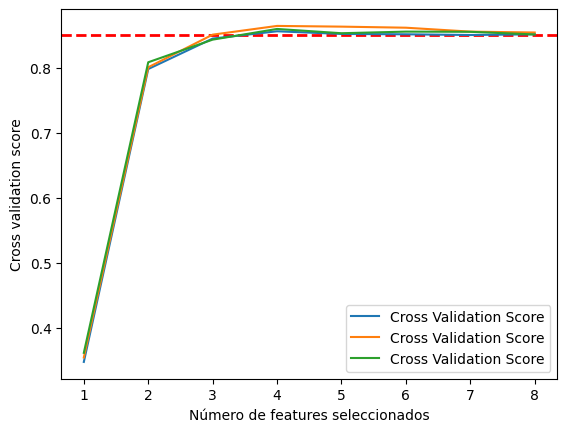

In [116]:
#se grafica la curva de score de validación cruzada con el incremento de features selccionados
plt.figure()
plt.xlabel("Número de features seleccionados")
plt.ylabel("Cross validation score")
plt.axhline(y=0.85, color='red', linestyle='--', linewidth=2)
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_, label='Cross Validation Score')
plt.legend()
plt.show()

##### • SFS

Se utiliza un algoritmo de Sequential Forward Selection para seleccionar features cuantitativos mas importantes para predecir la PROVINCIA.

In [117]:
sfs = SFS(estimator, direction='forward', cv=3) #se inicializa el modelo SFS con validación cruzada con 3 kfold

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [119]:
sfs.fit(X_train, y_train) # se entrena el modelo

SequentialFeatureSelector(cv=3,
                          estimator=RandomForestClassifier(random_state=1))

In [120]:
selected_features_sfs = sfs.support_ # caracteristicas seleccionadas

In [121]:
selected_features_sfs = X_train.columns[sfs.support_]
print("Características seleccionadas con sfs:", selected_features_sfs.tolist())

Características seleccionadas con sfs: ['AÑO', 'FACTORXCOMB', 'NUMEROMES', 'GEN_SCALE']


In [122]:
X_train_selected_sfs = X_train[selected_features_sfs]
cv_scores_sfs = cross_val_score(estimator, X_train_selected_sfs, y_train, cv=3) #se obtiene el score de validación cruzada del modelo entrenado con los features seleccionados

print("SFS Cross-validation scores:", cv_scores_sfs)
print("SFS Mean CV score:", cv_scores_sfs.mean())

SFS Cross-validation scores: [0.49808219 0.48328767 0.47616438]
SFS Mean CV score: 0.4858447488584475


##### [Volver al índice](#seccion-1)

Luego de haber aplicado Feature Selection y antes de avanzar al siguiente paso de modelado, se resume:

+ En base a SelectFromModel y SelectKbest aplicados a variables categóricas, para no complejizar el modelo con un número muy alto de variables de entrada y dado que la diferencia de score entre ambos es poco significativa, podemos utilizar la variable categórica REGION mediante encoding para predecir la provincia.
+ De los 2 modelos utilizados para feature selection de variables cuantitativas, se descarta SFS por el bajo valor de score obtenido y se avanza con los features (CONSUMO, GENERACION, EMIGEN y GEN_SCALE) que resultaron con RFECV para los cuales se logró un mejor score de validación.

#### **11. Entrenamiento y validación de modelos con algoritmos ML de clasificación** <a id='seccion-12'></a>



##### • Modelado simple con validación cruzada

Utilizando las variables resultantes de feature selection como inputs para predecir el target "PROVINCIA", se proponen 6 modelos simples con algoritmos ML de clasificación con el fin de compararlos y evaluar para cada uno la media de su scoring aplicando validación cruzada estratificada ya que existe desbalanceo en los datos.

Para realizar el modelado simple y su validación cruzada, se particiona previamente el dataset en dos subset, uno de entrenamiento con el 70% de datos y otro de testeo con el 30% de los datos.

In [123]:
listalabels= ["MAQUINA", "MES", "CENTRAL", "AGENTE", "PROVINCIA", "AGENTE DESCRIPCION", "COMBUSTIBLE", "REGION", "TIPOMAQ", "FUENTEGEN", "TECNOLOGIA", "AÑO", "FACTORXCOMB", "EMISION", "NUMEROMES","DEMANDA"]

In [124]:
A = dflimpio.drop(listalabels, axis=1)       # quantitative feature matrix
B = pd.get_dummies(dflimpio[['REGION']], drop_first=True).astype(int) # categorical feature matrix
X = pd.concat([A,B],axis=1) # feature matrix

In [125]:
y = dflimpio['PROVINCIA']

In [126]:
label_encoder = LabelEncoder() #se inicializa label encoder

In [127]:
y_encoded = label_encoder.fit_transform(y) #se transforma la variable objetivo en númerica para su procesamiento en el modelado

In [128]:
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=1) #separacion del dataset en uno de entrenamiento y otro de testeo

In [129]:
skfold = StratifiedKFold(n_splits=5, shuffle=True) ##se inicializa el modelo de CV con 5 stratified kfolds

In [130]:
#se inicializa cada uno de los modelos simples a entrenar
random_state = 42
modelos = []
modelos.append(DecisionTreeClassifier(random_state=random_state))
modelos.append(RandomForestClassifier(random_state=random_state))
modelos.append(AdaBoostClassifier(DecisionTreeClassifier(random_state=random_state),random_state=random_state))
modelos.append(GradientBoostingClassifier(random_state=random_state))
modelos.append(xgb.XGBClassifier(random_state=random_state))
modelos.append(CatBoostClassifier(random_state=random_state, verbose=False))

In [131]:
score='f1_weighted' #no se trabaja con accuracy dado que no es una métrica aconsejable dado el desbalanceo existente

In [132]:
cv_results = [] #se genera una lista para almacenar el score de la validación cruzada para cada uno de los modelos
for modelo in modelos :
    cv_results.append(cross_val_score(modelo, X_train, y_train, scoring = score, cv = skfold, n_jobs=-1)) #para cada modelo se obtiene el score de cada una de las validaciones cruzadas realizadas

In [133]:
#se calcula la medida y desvio estandar de los scores de cada uno de los modelos
cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(cv_result.std())

In [134]:
cv_res = pd.DataFrame({"CrossValMeans":cv_means,"CrossValerrors": cv_std,"ML Algorithm":["DecissionTree","RandomForest","AdaBoost","GradientBoost","XGBoost","CatBoost"]})
cv_res

,CrossValMeans,CrossValerrors,ML Algorithm
0,0.916810,0.001943,DecissionTree
1,0.931638,0.004125,RandomForest
2,0.919618,0.004828,AdaBoost
3,0.924728,0.005765,GradientBoost
4,0.939875,0.002805,XGBoost
5,0.939410,0.003211,CatBoost


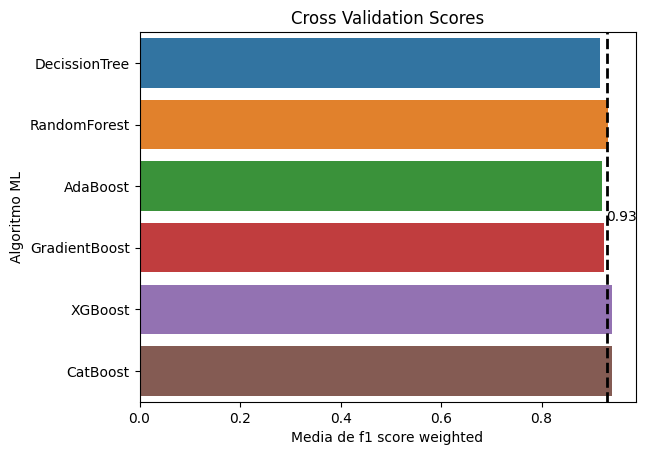

In [135]:
cvg = sns.barplot(x="CrossValMeans",y="ML Algorithm",data = cv_res, orient = "h")
cvg.set_xlabel("Media de f1 score weighted")
cvg.set_ylabel("Algoritmo ML")
cvg.axvline(x=0.93, color='black', linestyle='--', linewidth=2)
cvg.text(0.94 , 0.5, '0.93', color='black', ha='left', va='center', fontsize=10, transform=plt.gca().transAxes)
cvg = cvg.set_title("Cross Validation Scores")

##### • Balanceo de clases + modelado simple con validación cruzada

Se plantean los mismos modelos que en el apartado anterior pero previamente se aplica una técnica de balanceo SMOTE sobre los datos de entrenamiento, es decir se generan muestras sintéticas de las clases minoritarias de la variable target en base a los datos existentes. El objetivo de esto es evaluar si el desbalanceo existente está afectando significativamentge el desempeño de los modelos propuestos. En este caso la validación cruzada se realiza mediante un metodo kfold de 5 splits.

In [136]:
smote = SMOTE(random_state = 14)
X_train_bl, y_train_bl = smote.fit_resample(X_train, y_train) #se balancea el set de entrenamieto

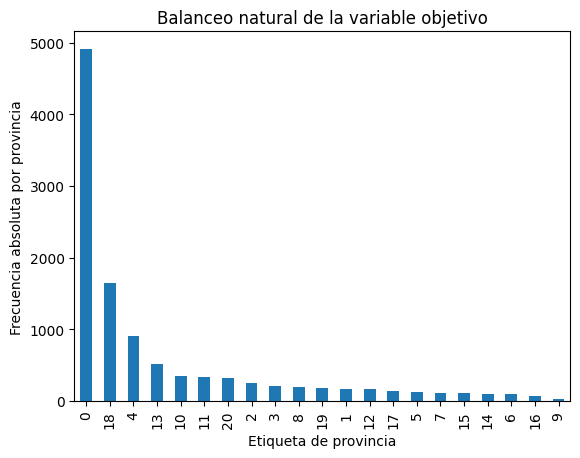

In [137]:
pd.Series(y_train).value_counts().plot(kind='bar')
plt.title('Balanceo natural de la variable objetivo')
plt.xlabel('Etiqueta de provincia')
plt.ylabel('Frecuencia absoluta por provincia')
plt.show()

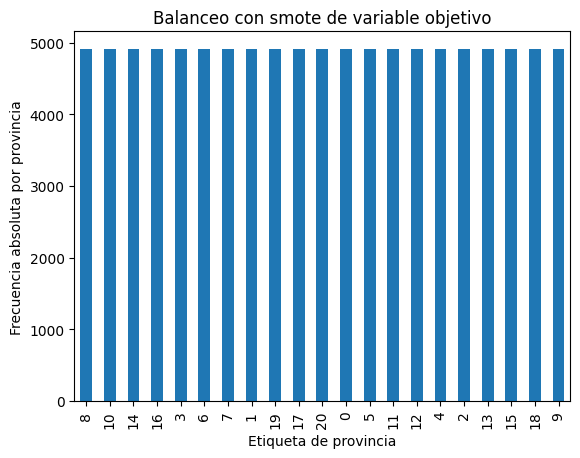

In [138]:
pd.Series(y_train_bl).value_counts().plot(kind='bar')
plt.title('Balanceo con smote de variable objetivo')
plt.xlabel('Etiqueta de provincia')
plt.ylabel('Frecuencia absoluta por provincia')
plt.show()

In [139]:
kfold = KFold(n_splits=5, shuffle=True) ##se inicializa el modelo de CV con 5 kfolds

In [140]:
cv_results_bl = [] #se genera una lista para almacenar el score de la validación cruzada para cada uno de los modelos
for modelo in modelos :
    cv_results_bl.append(cross_val_score(modelo, X_train_bl, y_train_bl, scoring = score, cv = kfold, n_jobs=-1)) #para cada modelo se obtiene el score de cada una de las validaciones cruzadas realizadas

In [141]:
#se calcula la medida y desvio estandar de los scores de cada uno de los modelos
cv_means_bl = []
cv_std_bl = []
for cv_result_bl in cv_results_bl:
    cv_means_bl.append(cv_result_bl.mean())
    cv_std_bl.append(cv_result_bl.std())

In [142]:
cv_res_bl = pd.DataFrame({"CrossValMeans":cv_means_bl,"CrossValerrors": cv_std_bl,"ML Algorithm":["DecisionTree","RandomForest","AdaBoost","GradientBoosting","XGBoost","CatBoost"]})
cv_res_bl

,CrossValMeans,CrossValerrors,ML Algorithm
0,0.970420,0.001557,DecisionTree
1,0.982317,0.000694,RandomForest
2,0.970541,0.000679,AdaBoost
3,0.915972,0.001927,GradientBoosting
4,0.974414,0.000267,XGBoost
5,0.957600,0.001562,CatBoost


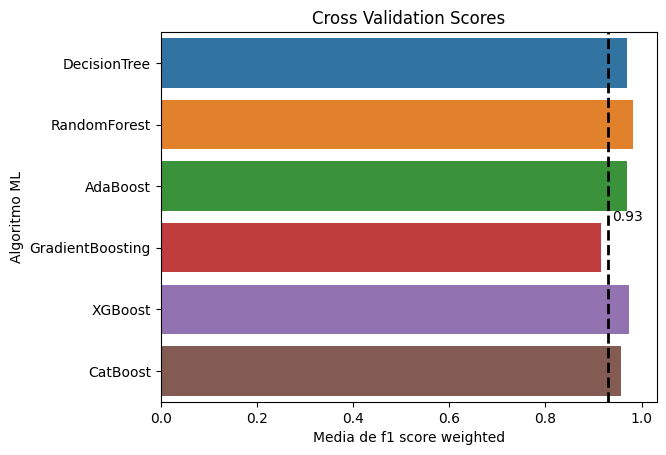

In [143]:
cvgbl = sns.barplot(x="CrossValMeans", y="ML Algorithm", data = cv_res_bl, orient = "h")
cvgbl.set_xlabel("Media de f1 score weighted")
cvgbl.set_ylabel("Algoritmo ML")
cvgbl.axvline(x=0.93, color='black', linestyle='--', linewidth=2)
cvgbl.text(0.91 , 0.5, '0.93', color='black', ha='left', va='center', fontsize=10, transform=plt.gca().transAxes)
cvgbl = cvgbl.set_title("Cross Validation Scores")

##### • Hypertuning

Luego de realizar la validación cruzada de modelos de entrenamiento con y sin balanceo de clases se observa que la performance de los modelos de entrenamiento con balanceo son superiores, con valores más cercanos a uno, comparado con los casos donde se mantiene el desbalanceo de clases. Se decide realizar una optimización de hiperparametros para los modelos de XGBoost,  CatBoost y Random Forest con los datos sin balanceo ya que la cantidad de muestras artificiales generadas con SMOTE, para equiparar las clases minoritarias con la mayoritaria, es muy significativa y la mejora de desempeño de los modelos no es tan significativa como para justificar el elevado costo computacional que el entrenamiento con datos balanceados implica.

###### XGBoost

In [144]:
XGBoost_params_grid = {
        'n_estimators': [50, 100, 200, 500], # número de árboles
        'min_child_weight': [1, 5, 10], #cantidad mínima de muestras por hoja
        'gamma': [0.5, 1, 1.5], # penalización por complejidad del árbol
        'learning_rate': [0.1, 0.15, 0.2, 0.25], # tasa de aprendizaje
        'max_depth': [4,5,6,7]} # profundidad máxima del árbol

In [145]:
XGBoost = xgb.XGBClassifier(random_state=42)

In [146]:
grid_cv_xgb = RandomizedSearchCV(XGBoost, XGBoost_params_grid, scoring="accuracy", n_jobs=-1, cv=3)
grid_cv_xgb.fit(X_train, y_train)

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_jobs=-1,
                   param_distributions={'gamma': [0.5, 1, 1.5],
                                        'learning_rate': [0.1, 0.15, 0.2, 0.25],
                                        'max_depth': [4, 5, 6, 7],
                                        'min_child_weight': [1, 5, 10],
                                        'n_estimators': [50, 100, 200, 500]},
                   scoring='accuracy')

In [147]:
print("Mejores parametros", grid_cv_xgb.best_params_)
print("Mejor score de CV", grid_cv_xgb.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_encoded, grid_cv_xgb.predict(X)), 5)}')

Mejores parametros {'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0.5}
Mejor score de CV 0.9322374429223744
Accuracy del modelo = 0.9612


###### Random Forest

In [148]:
RF_params_grid = {"max_depth": [4,5,6,7,10], # profundidad máxima del árbol
              "n_estimators" :[50, 100, 200, 500], # número de árboles
              "criterion": ["gini", "entropy"]} #criterio de ganancia

In [149]:
RF = RandomForestClassifier(random_state=42)

In [150]:
grid_cv_rf = RandomizedSearchCV(RF, RF_params_grid, scoring="accuracy", n_jobs=-1, cv=3)
grid_cv_rf.fit(X_train, y_train)

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [4, 5, 6, 7, 10],
                                        'n_estimators': [50, 100, 200, 500]},
                   scoring='accuracy')

In [151]:
print("Mejores parametros", grid_cv_rf.best_params_)
print("Mejor score de CV", grid_cv_rf.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_encoded, grid_cv_rf.predict(X)), 5)}')

Mejores parametros {'n_estimators': 500, 'max_depth': 7, 'criterion': 'entropy'}
Mejor score de CV 0.9040182648401828
Accuracy del modelo = 0.9114


###### CatBoost

In [152]:
CatBoost_params_grid = {
    'iterations': [100, 200, 500], #numero de iteraciones del algoritmo
    'learning_rate': [0.1, 0.15, 0.2, 0.25], #tasa de aprendizaje del algoritmo
    'depth': [4,5,6,7], #profundidad maxima de cada arbol
    'bagging_temperature': [0.5, 1, 1.5], #intensidad del bagging, cuanto mas alto mas sobreajuste hay
    'random_strength': [0.5, 1, 1.5]} #intensidad del muestreo aleatorio

In [153]:
CatBoost = CatBoostClassifier(random_state=42, verbose = False)

In [154]:
grid_cv_cb = RandomizedSearchCV(CatBoost, CatBoost_params_grid, scoring="accuracy", n_jobs=-1, cv=3)
grid_cv_cb.fit(X_train, y_train)

RandomizedSearchCV(cv=3,
                   estimator=<catboost.core.CatBoostClassifier object at 0x0000024BD5911850>,
                   n_jobs=-1,
                   param_distributions={'bagging_temperature': [0.5, 1, 1.5],
                                        'depth': [4, 5, 6, 7],
                                        'iterations': [100, 200, 500],
                                        'learning_rate': [0.1, 0.15, 0.2, 0.25],
                                        'random_strength': [0.5, 1, 1.5]},
                   scoring='accuracy')

In [155]:
print("Mejores parametros", grid_cv_cb.best_params_)
print("Mejor score de CV", grid_cv_cb.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_encoded, grid_cv_cb.predict(X)), 5)}')

Mejores parametros {'random_strength': 0.5, 'learning_rate': 0.2, 'iterations': 500, 'depth': 6, 'bagging_temperature': 0.5}
Mejor score de CV 0.9384474885844748
Accuracy del modelo = 0.97315


##### • Curvas de aprendizaje

Se grafican las curvas de aprendizaje de entrenamiento y la curva de aprendizaje de validación cruzada para cada uno de los modelos optimizados de manera de evaluar el grado de ajuste y si existe riesgo de overfitting en cada caso. La idea final de esto es definir si existe alguna opción de modelo de ensamble que tome las bondades de cada modelo simple y permita garantizar una mejor predicción.

Las curvas de aprendizaje indican que tanto CatBoost como XGBoost generan mas overfitting en el entrenamiento comparado con Random Forest donde el sobreajuste es inferior con el aumento de los datos de entrenamiento.

Por otro lado al aumentar los datos de entrenamiento, la cercanía entre las curva de entrenamiento y validación cruzada de los 3 modelos es casi similiar, aunque hay una ventaja también a favor de Random Forest comparada con el resto de los modelos. De cualquier manera los 3 modelos parecerían generalizar bien la predicción.

In [156]:
#se genera una función para graficar la curva de aprendizaje para luego aplicarlo a cada modelo optimizado

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    plt.legend(loc="best")
    return plt

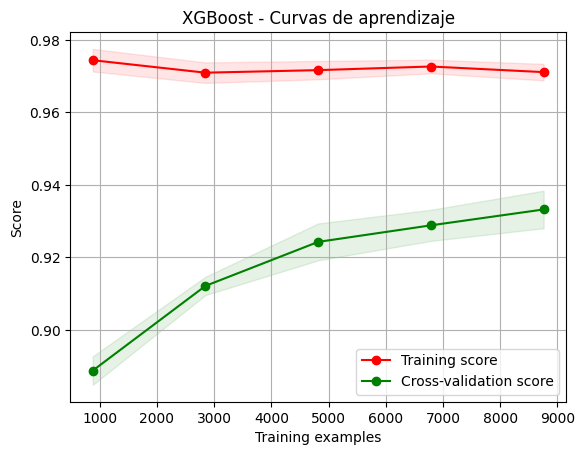

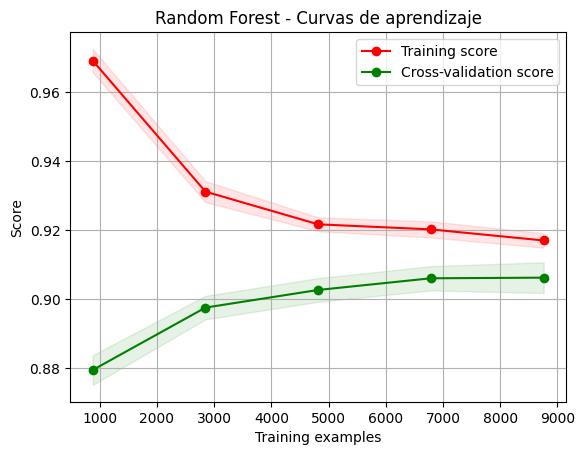

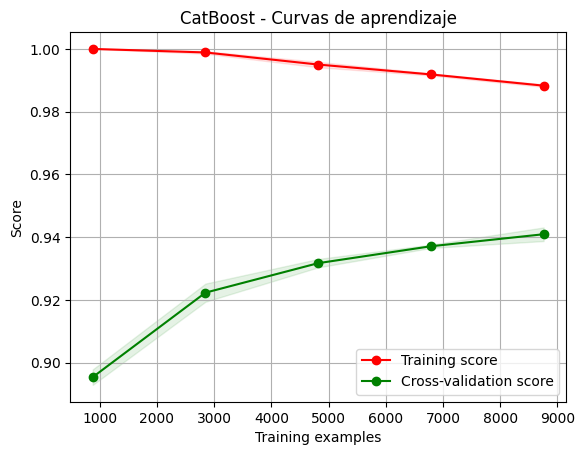

In [157]:
g_xgb = plot_learning_curve(grid_cv_xgb.best_estimator_, "XGBoost - Curvas de aprendizaje", X_train, y_train, cv=skfold)
g_rf = plot_learning_curve(grid_cv_rf.best_estimator_, "Random Forest - Curvas de aprendizaje", X_train, y_train, cv=skfold)
g_cb = plot_learning_curve(grid_cv_cb.best_estimator_, "CatBoost - Curvas de aprendizaje", X_train, y_train, cv=skfold)

##### • Feature importance de los modelos

Se gráfican para los 3 modelos de clasificación optimizados, la importancia relativa individual de cada una de las características utilizadas en la predicción de la variable objetivo y también la importancia relativa acumulada por modelo para identificar sobre que características se basan mayoritamente los modelos para realizar la estimación.

Se observa que en los 3 casos los features con mas peso tienen que ver con la región y en algunos casos las variables cuantitativas GEN_SCALE y EMIGEN tienen un poco mas de incidencia que en otros.

+ En el caso de XGBoost casi la totalidad de la incidencia está dada por la región y el modelo poco y nada se basa en las variables cuantitativas para realizar la predicción.

+ Para Random Forest, las variables cuantitativas GEN_SCALE y EMIGEN tienen algo más de incidencia en el modelo para predecir pero la región sigue siendo significativa donde REGION_LITORAL, REGION_CENTRO y REGION_NOROESTE se llevan aproximadamente el 50% de la incidencia total.

+ Con CatBoost, el comportamiento es muy similar a lo que sucede con Random Forest aunque cambien algunas incidencias puntuales. 

En resumen, de acuerdo a feature importance, los modelos para las predicciones de la provincia se basan principalemnte en la región y segun cual sea el estimador, las variables cuantitativas obtenidas por feature engineering son tenidas en cuenta en mayor o menor medida para la predicción.

Por otro lado, haciendo un mapa de calor de correlación entre los 3 modelos, pareciera ser que la predicción resulta ser similar para los 3 casos.

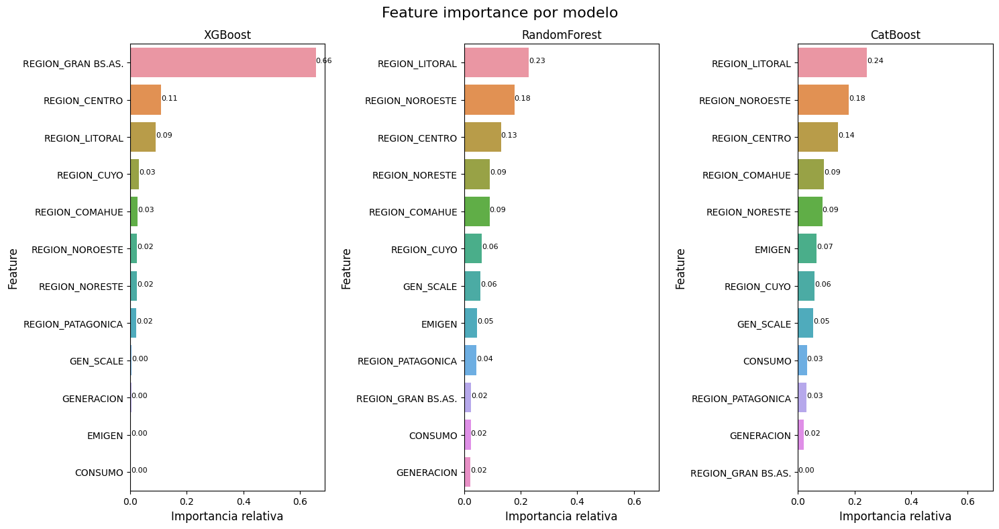

In [158]:
nrows = 1
ncols = 3
num_features = X_train.shape[1]
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, figsize=(15, 8))

names_classifiers = [("XGBoost", grid_cv_xgb.best_estimator_), ("RandomForest", grid_cv_rf.best_estimator_), ("CatBoost", grid_cv_cb.best_estimator_)]

nclassifier = 0

for name, classifier in names_classifiers:
    # Se obtienen las importancias relativas de las características del modelo
    feature_importances = classifier.feature_importances_

    if name == "CatBoost":
        feature_importances = (feature_importances / 100)
    indices = np.argsort(feature_importances)[::-1][:num_features]  #se seleccionan los índices de las importancias relativas y los ordena en forma descendente

    ax = axes[nclassifier]
    sns.barplot(y=X_train.columns[indices][:num_features], x=feature_importances[indices][:num_features], orient='h', ax=ax)

    for i, v in enumerate(feature_importances[indices][:num_features]):
          #para cada feature del modelo se van agregando etiquetas de datos con su importancia relativa 
        ax.text(v, i, f'{v:.2f}', color='black', fontsize=8, ha='left')

    ax.set_xlabel("Importancia relativa", fontsize=12)
    ax.set_ylabel("Feature", fontsize=12)
    ax.set_title(name)
    nclassifier += 1

fig.suptitle("Feature importance por modelo", fontsize=16)
plt.tight_layout()
plt.show()

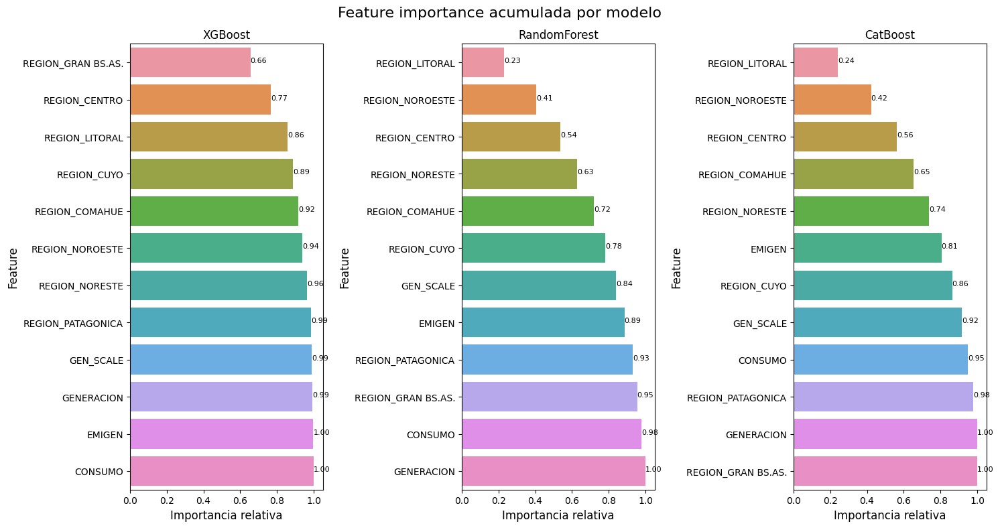

In [159]:
nrows = 1
ncols = 3
num_features = X_train.shape[1]
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, figsize=(15, 8))

names_classifiers = [("XGBoost", grid_cv_xgb.best_estimator_),("RandomForest", grid_cv_rf.best_estimator_),("CatBoost", grid_cv_cb.best_estimator_)]

nclassifier = 0

for name, classifier in names_classifiers:
    # Se obtienen las importancias relativas de las características del modelo
    feature_importances = classifier.feature_importances_

    if name == "CatBoost":
        feature_importances = (feature_importances / 100)
    indices = np.argsort(feature_importances)[::-1][:num_features]  #se seleccionan los índices de las importancias relativas y los ordena en forma descendente

    acumulative_importance = np.cumsum(feature_importances[indices])  # Se calcula la importancia relativa acumulada para agregar como etiqueta de dato en el gráfico
    ax = axes[nclassifier]
    sns.barplot(y=X_train.columns[indices][:num_features], x=acumulative_importance, orient='h', ax=ax)

    for i, v in enumerate(acumulative_importance):
        #para cada feature del modelo se van agregando etiquetas de datos con la importancia acumulada hasta llegar al 100%
        ax.text(v, i, f'{v:.2f}', color='black', fontsize=8, ha='left')

    ax.set_xlabel("Importancia relativa", fontsize=12)
    ax.set_ylabel("Feature", fontsize=12)
    ax.set_title(name)
    nclassifier += 1

fig.suptitle("Feature importance acumulada por modelo", fontsize=16)
plt.tight_layout()
plt.show()

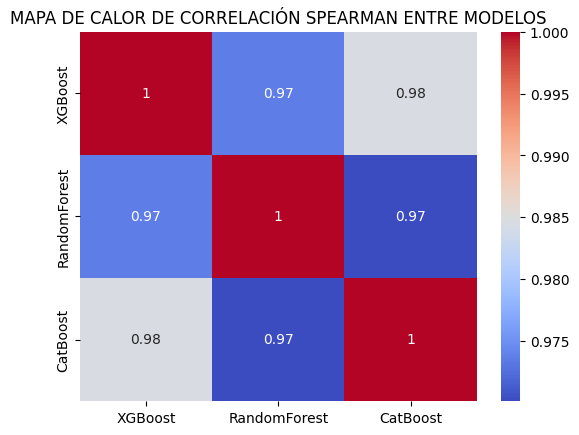

In [160]:
test_XGB = pd.Series(grid_cv_xgb.best_estimator_.predict(X_test), name="XGBoost")
test_RF = pd.Series(grid_cv_rf.best_estimator_.predict(X_test), name="RandomForest")
test_CB = pd.Series(grid_cv_cb.best_estimator_.predict(X_test)[:, 0], name="CatBoost")

ensemble_results = pd.concat([test_XGB,test_RF,test_CB],axis=1)


grid_corr = sns.heatmap(ensemble_results.corr('spearman'), annot=True, cmap="coolwarm")
grid_corr.set_title("MAPA DE CALOR DE CORRELACIÓN SPEARMAN ENTRE MODELOS")
warnings.filterwarnings('ignore')

##### • Ensamble XGBoost + Random Forest + CatBoost

De lo analizado con las curvas de aprendizaje y feature importance es válido considerar entonces un modelo de clasificación por votación que combine el mejor modelo obtenido con XGBoost, Random Forest y CatBoost. Se considera para este caso que la votación sea "soft" para que el modelo considere la probabilidad de predicción para cada valor de provincia.

Una vez inicializado y entrenado el modelo con los datos del muestreo inicial, se realiza la predicción sobre la muestra de testeo que se definió inicialmente de manera de poder evaluar las métricas finales.

In [161]:
ensamble = VotingClassifier(estimators=[('XGBoost', grid_cv_xgb.best_estimator_), ('RF', grid_cv_rf.best_estimator_), ('CatBoost', grid_cv_cb.best_estimator_)], voting='soft', n_jobs=-1)

ensamble = ensamble.fit(X_train, y_train)

In [162]:
pred = ensamble.predict(X_test) #se realiza la predicción con el modelo de ensamble

In [163]:
#se transforma el etiquedado a los valores originales de las provincias
y_test_original = label_encoder.inverse_transform(y_test)
pred_original = label_encoder.inverse_transform(pred)

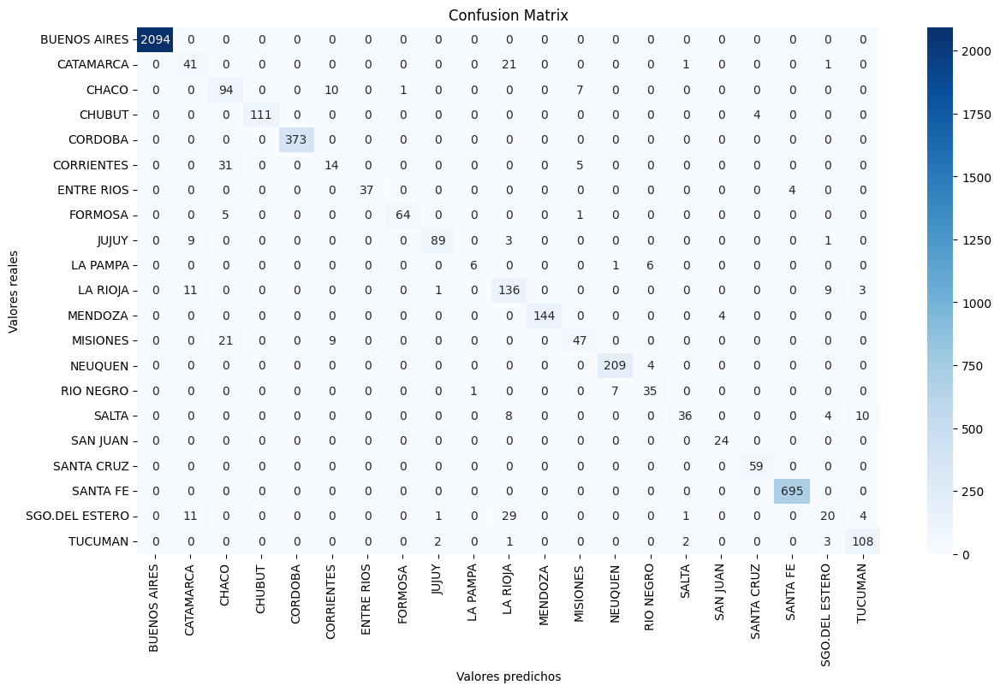

In [164]:
cf_matrix = confusion_matrix(y_test_original, pred_original)
fig, ax = plt.subplots(figsize=(14,8))
ax = sns.heatmap(cf_matrix, annot=True, fmt='d', cmap='Blues')
ax.set_title('Confusion Matrix')
ax.set_xlabel('Valores predichos')
ax.set_ylabel('Valores reales')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
ax.xaxis.set_ticklabels(np.unique(pred_original))
ax.yaxis.set_ticklabels(np.unique(y_test_original))
plt.show()

In [165]:
print(metrics.classification_report(y_true=y_test_original, y_pred=pred_original)) #se calculan las métricas para validar la predicción

                precision    recall  f1-score   support

  BUENOS AIRES       1.00      1.00      1.00      2094
     CATAMARCA       0.57      0.64      0.60        64
         CHACO       0.62      0.84      0.71       112
        CHUBUT       1.00      0.97      0.98       115
       CORDOBA       1.00      1.00      1.00       373
    CORRIENTES       0.42      0.28      0.34        50
    ENTRE RIOS       1.00      0.90      0.95        41
       FORMOSA       0.98      0.91      0.95        70
         JUJUY       0.96      0.87      0.91       102
      LA PAMPA       0.86      0.46      0.60        13
      LA RIOJA       0.69      0.85      0.76       160
       MENDOZA       1.00      0.97      0.99       148
      MISIONES       0.78      0.61      0.69        77
       NEUQUEN       0.96      0.98      0.97       213
     RIO NEGRO       0.78      0.81      0.80        43
         SALTA       0.90      0.62      0.73        58
      SAN JUAN       0.86      1.00      0.92  

##### • Validación de predicciones

Analizando los resultados de las métricas f1 score para la predicciones del modelo realizadas con los datos de prueba, se observa que a pesar de tener un buen desempeño en general, para algunas clases minoritarias como por ejemplo (CORRIENTES,, SGO DEL ESTERO y CATAMARCA) al modelo le cuesta identificar el valor correcto de provincia y si lo hace no es del todo confiable. Se procede a filtar el dataset, excluyendo los datos de estas clases, de manera de volver a entrenar el modelo de votación y evaluar como son las métricas de desempeño para predecir las clases remanentes.

In [166]:
#se filtran los datos que no corresponden a las provincias de corrientes, sgo del extero y catamarca
df_trunc = dflimpio.drop(dflimpio[(dflimpio['PROVINCIA'] == "CORRIENTES") | (dflimpio['PROVINCIA'] == "SGO.DEL ESTERO") | (dflimpio['PROVINCIA'] == "CATAMARCA")].index) 

In [167]:
A_trunc = df_trunc.drop(listalabels, axis=1)       # quantitative feature matrix
B_trunc = pd.get_dummies(df_trunc[['REGION']], drop_first=True).astype(int) # categorical feature matrix
X_trunc = pd.concat([A_trunc,B_trunc],axis=1) # feature matrix

In [168]:
y_trunc = df_trunc['PROVINCIA']

In [169]:
y_trunc_encoded = label_encoder.fit_transform(y_trunc)

In [170]:
X_trunc_train, X_trunc_test, y_trunc_train, y_trunc_test = train_test_split(X_trunc, y_trunc_encoded, test_size=0.3, random_state=1) #separacion del nuevo dataset en uno de entrenamiento y otro de testeo

In [171]:
ensamble_trunc = ensamble.fit(X_trunc_train, y_trunc_train) #se entrena el modelo con los nuevos datos de entrenamiento

In [172]:
pred_trunc = ensamble_trunc.predict(X_trunc_test) #se realiza la predicción con los nuevos valores de prueba

In [173]:
y_trunc_test_original = label_encoder.inverse_transform(y_trunc_test)
pred_trunc_original = label_encoder.inverse_transform(pred_trunc)

In [174]:
print(metrics.classification_report(y_true=y_trunc_test_original, y_pred=pred_trunc_original)) #se calculan las nuevas métricas

              precision    recall  f1-score   support

BUENOS AIRES       1.00      1.00      1.00      2053
       CHACO       0.89      0.83      0.86       134
      CHUBUT       0.94      0.97      0.96       106
     CORDOBA       1.00      1.00      1.00       373
  ENTRE RIOS       1.00      0.81      0.90        48
     FORMOSA       0.93      0.89      0.91        57
       JUJUY       0.99      0.87      0.93        78
    LA PAMPA       1.00      0.85      0.92        13
    LA RIOJA       0.87      0.95      0.91       148
     MENDOZA       0.99      0.98      0.99       146
    MISIONES       0.69      0.81      0.75        64
     NEUQUEN       0.97      0.98      0.98       233
   RIO NEGRO       0.84      0.86      0.85        37
       SALTA       0.89      0.81      0.85        52
    SAN JUAN       0.89      0.96      0.93        26
  SANTA CRUZ       0.95      0.90      0.93        63
    SANTA FE       0.99      1.00      0.99       733
     TUCUMAN       0.93    

##### [Volver al índice](#seccion-1)

Se observa que el desempeño del modelo mejora  y se deberá consultar con el negocio que puede estar generando esta limitación para los casos particulares de provincias donde el modelo no garantiza un predicción correcta.

#### **12. Conclusión** <a id='seccion-13'></a>

Para el problema de clasificación propuesto se puede concluir lo siguiente:

- Utilizar solo variables cuantitativas para el problema de clasificación de este proyecto no es suficiente.

- Aplicar Feature Selection permitió encontar un balance óptimo de características cuantitativas y categóricas disponibles en el datasets para lograr modelos que generalizan bien las predicciones.

- Si bien se aplicó una técnica de balanceo a las muestras para el entrenamiento ya que se trata de un datasets con clases desbalanceadas para la variable objetivo, la mejora de desempeño en los modelos no es tan significativa como para justificar el elevado costo computacional que el entrenamiento con datos balanceados implica.

- Las curvas de aprendizaje para los modelos de entrenamiento optimizados con hiper parámetros muestran para cada uno un ajuste que generaliza bien la clasificación al aumentar los datos de entrenamiento pero si se quiere ser fino con Random Forest el sobreajuste es levemente inferior.

- Los modelos entrenados y optimizados para efectuar la predicción se basan principalmente en la variable REGION y en menor medida, segun sea el caso del estimador, en las variables sintéticas obtenidas mediante feature engineering, GEN_SCALE (generación escalada por demanda) y EMIGEN (tasa de emisión por generación).

- Es válido proponer como solución al problema del proyecto un modelo de ensamble de clasificación por votación. Esto es porque los 3 mejores modelos que lo sustentan generan resultados de predicción similares y resulta conveniente combinar los buenos aportes de cada uno y amortiguar sus debilidades de manera de lograr un balance con el menor sesgo y varianza posible.

- Dado el desbalanceo existente en la variable Provincia, con el modelo de ensamble resultante se obtuvo un f1 score ponderado del 94% en las predicciones. Sin embargo el modelo parece tener dificultades para predecir correctamente algunas provincias minoritarias como por ejemplo Corrientes, Santiago del Estero, Catamarca. Será importante contrastar estas limitaciones con el negocio para identificar a que puede deberse esta imposibilidad para predecir correctamente estos casos puntuales.

##### [Volver al índice](#seccion-1)